This script clusters the different features and representations exported from .feature_extraction.ipynb.

At the beginning of every run, the dataset is bootstrapped to retrieve different class subset sizes.

1) Nearest neighbour graphs of all representations are created based on euclidian distance
2) Embeddings are created using **UMAP** and **Hopkins** statistic computed for each embeddings- and original feature space
3) The following three clustering algorithms are applied:
    - **kMeans**
    - **HDBSCAN**
    - **Leiden**
4) All resulting clusterings are evaluated with
    - **silhouette score**
    - **V-measure**
    - **Adjusted Rand score**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import json
import random
from tqdm.auto import tqdm

from sklearn.preprocessing import LabelEncoder
import umap
from umap.umap_ import nearest_neighbors
from sklearn.preprocessing import StandardScaler

from sklearn.metrics.cluster import v_measure_score, completeness_score, homogeneity_score
from sklearn.metrics import adjusted_rand_score, silhouette_score

from utils import plotting, clustering, stats
from sklearn.manifold import trustworthiness

/Users/lenagies/anaconda3/envs/goose_vocalizations/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# For plotting
sns.set_theme("paper")
CALL_TYPE_COLORS = {'alarm': (0.2823529411764706, 0.47058823529411764, 0.8156862745098039), 
                    'contact': (0.9333333333333333, 0.5215686274509804, 0.2901960784313726), 
                    'departure': (0.41568627450980394, 0.8, 0.39215686274509803), 
                    'distance': (0.8392156862745098, 0.37254901960784315, 0.37254901960784315), 
                    'recruitment': (0.5843137254901961, 0.4235294117647059, 0.7058823529411765), 
                    'triumph': (0.5490196078431373, 0.3803921568627451, 0.23529411764705882)}
DOT_SIZE = 10
ALPHA = .5

In [3]:
columns = [
    'Representation', 
    'Algorithm', 
    'Distance metric', 
    'Subset size', 
    'Cluster labels', 
    'V-measure', 
    'Adj. RS', 
    'Hopkins', 
    'Silhouette Score', 
    'Modularity',
    'Homogeneity',
    'Completeness'
    ]

results_df = pd.DataFrame(columns=columns)

In [4]:
RANDOM_SEED = 42
random.seed(RANDOM_SEED)
np.random.RandomState(RANDOM_SEED)

RandomState(MT19937) at 0x1369C8A40

In [5]:
# List of titles for plots of PAFs
feature_titles_list = [
    "Duration [s]",
    "Temporal 1st Quartile [s]", 
    "Temporal Median [s]", 
    "Temporal 3rd Quartile [s]", 
    "Temporal Standard Deviation [s]", 
    "Temporal Skewness", 
    "Temporal Kurtosis", 
    "Temporal Entropy", 
    "Mean Frequency [kHz]",
    "Mean Peak Frequency [kHz]",
    "Spectral Sandard Deviation [kHz]",
    "Spectral Flatness", 
    "Frequency 1st Quartile [kHz]",
    "Frequency Median [kHz]", 
    "Frequency 3rd Quartile [kHz]", 
    "Mean Dominant Frequency [kHz]", 
    "Min Dominant Frequency [kHz]",
    "Max Dominant Frequency [kHz]", 
    "Dominant Frequency Range [kHz]", 
    "Dominant Frequency Modulation [kHz]", 
    "Spectral Entropy", 
    "Harmonics-to-Noise Ratio [dB]",
    "Spectrographic Entropy"
    ]

# List of column names of PAFs
feature_columns_list = [
    "duration",
    "t_q1", 
    "t_median", 
    "t_q3", 
    "std_t", 
    "skew_t", 
    "kurt_t", 
    "t_entropy", 
    "mean_f",
    "mean_peak_f", 
    "std_f",
    "flatness_s", 
    "f_q1",
    "f_median", 
    "f_q3", 
    "mean_dom", 
    "min_dom",
    "max_dom", 
    "range_dom", 
    "mod_dom", 
    "pse", 
    "hnr",
    "spectrographic_entropy"
    ]

In [6]:
len(feature_columns_list)

23

# Import the dataset

In [7]:
calls_df = pd.read_csv('features_and_spectrograms.csv')
calls_df['log_padded_spectrogram'] = calls_df['log_padded_spectrogram'].apply(lambda x: np.array(json.loads(x)))
calls_df['log_padded_log_freq_spectrogram'] = calls_df['log_padded_log_freq_spectrogram'].apply(lambda x: np.array(json.loads(x)))
calls_df['log_padded_lfccs'] = calls_df['log_padded_lfccs'].apply(lambda x: np.asarray(json.loads(x)))
calls_df['log_padded_mfccs'] = calls_df['log_padded_mfccs'].apply(lambda x: np.asarray(json.loads(x)))

In [8]:
# import latent representations from VAE and merge with calls df
representations_df = pd.read_csv("pickles_and_csvs/latent_representations_CVAE_adam.csv")
representations_df["latent_representation"] = representations_df["latent_representation"].apply(lambda x: np.asarray(json.loads(x)))
calls_df = pd.merge(calls_df, representations_df, on="clip_ID")
calls_df = calls_df.drop(columns=["call_type_y"])
calls_df = calls_df.rename(columns={"call_type_x": "call_type"})

In [9]:
print(len(calls_df[calls_df.isna().any(axis=1)]))
calls_df = calls_df.dropna()
calls_df.info()

0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 40 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   track_ID                         7043 non-null   object 
 1   clip_ID                          7043 non-null   object 
 2   goose_ID                         7043 non-null   object 
 3   call_type                        7043 non-null   object 
 4   waveform                         7043 non-null   object 
 5   sr                               7043 non-null   int64  
 6   filepath                         7043 non-null   object 
 7   log_scaled_spectrogram           7043 non-null   object 
 8   lfccs                            7043 non-null   object 
 9   mfccs                            7043 non-null   object 
 10  peak                             7043 non-null   float64
 11  duration                         7043 non-null   float64
 12  log_padded_spectro

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1510808998.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  hist = sns.histplot(


[]

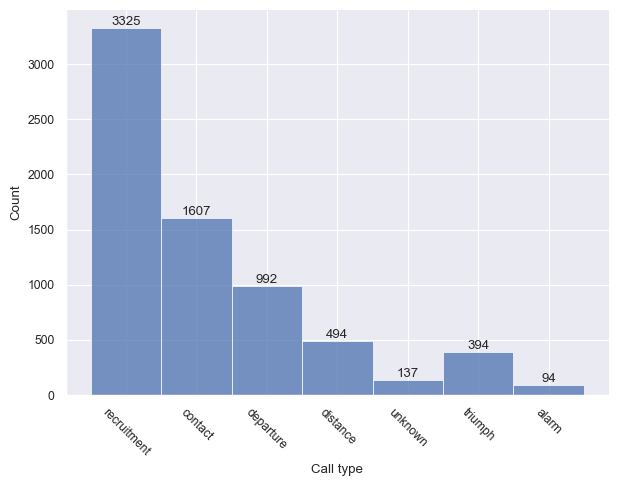

In [10]:
f, ax = plt.subplots(figsize=(7, 5))
sns.despine(f)

hist = sns.histplot(
    calls_df,
    x="call_type",
    multiple="stack",
    palette="viridis",
    edgecolor="1",
    linewidth=.5,
)

plt.xticks(rotation=-45)
ax.set_xlabel("Call type")

# Add counts
for p in hist.patches:
    height = p.get_height()
    x = p.get_x() + p.get_width() / 2
    ax.annotate(f'{int(height)}', (x, height), ha='center', va='bottom')
    
plt.plot()

In [11]:
# Group discard unknown calls
calls_df = calls_df[calls_df['call_type']!='unknown']

## Bootstrap to subset size and run pipeline

In [12]:
def create_representations_subdf_and_scale(full_df, column_name, column_names=["call_type", "track_ID", "goose_ID"]):
    column_names_new_df = column_names.copy()
    subset_list = []
    for idx, row in full_df.iterrows():
        subset_list.append([row["call_type"], row["track_ID"], row["goose_ID"], *row[column_name].flatten()])

    for i in range(len(full_df.iloc[0][column_name].flatten())):
        column_names_new_df.append(i)

    subset_df = pd.DataFrame(subset_list, columns=column_names_new_df, index=None)
    subset_df.head()

    subset_scaled = StandardScaler().fit_transform(subset_df.drop(columns=column_names))

    return subset_scaled, subset_df

In [13]:
def resample_subset(subset_size, df):
    subsample_sizes = {
        'recruitment': subset_size,
        'contact': subset_size,
        'departure': subset_size,
        'distance': subset_size,
        'triumph': subset_size,
        'alarm': subset_size
    }

    def subsample_group(group):
        call_type = group.name  
        target_size = subsample_sizes.get(call_type, 0)  # Default to 0 if missing

        if len(group) > target_size:
            return group.sample(n=target_size, random_state=RANDOM_SEED)
        return group  # Return full group if it's already smaller than the target size
    
    return df.groupby('call_type', group_keys=False)[df.columns.tolist()].apply(subsample_group)

In [14]:
NEIGHBORS_RATIO = .2
DISTANCE_METRIC = "euclidean"

In [15]:
def plot_all(subset_df, embeddings_paf, embeddings_lfcc, embeddings_spec, embeddings_vae):
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_paf, "call_type", "UMAP embeddings of PAFs", "Call Type")
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_lfcc, "call_type", "UMAP embeddings of lfccs", "Call Type")
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_spec, "call_type", "UMAP embeddings of spectrograms", "Call Type")
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_vae, "call_type", "UMAP embeddings of VAE representations", "Call Type")

    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_paf, "goose_ID", "UMAP embeddings of PAFs - Goose ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_lfcc, "goose_ID", "UMAP embeddings of lfccs - Goose ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_spec, "goose_ID", "UMAP embeddings of spectrograms - Goose ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_vae, "goose_ID", "UMAP embeddings of VAE representations - Goose ID", show_legend=False)

    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_paf, "track_ID", "UMAP embeddings of PAFs - Track ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_lfcc, "track_ID", "UMAP embeddings of lfccs - Track ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_spec, "track_ID", "UMAP embeddings of spectrograms - Track ID", show_legend=False)
    plotting.plot_embeddings_with_colorcoded_label(subset_df, embeddings_vae, "track_ID", "UMAP embeddings of VAE representations - Track ID", show_legend=False)


In [16]:
from sklearn.metrics.pairwise import pairwise_distances
import itertools
def continuity(X, X_embedded, *, n_neighbors=5, input_metric='precomputed', output_metric = 'euclidean'):
    """
    Taken rom Martin et al. 2023: https://gitlab.com/kimartin/cluster_rook_vocs/-/blob/main/utilities/clusterability.py?ref_type=heads
    """
    if not isinstance(X_embedded, list):
        X_embedded = [X_embedded]
    if not isinstance(n_neighbors, list):
        n_neighbors = [n_neighbors]

    if 1 != len(n_neighbors) and len(n_neighbors) != len(X_embedded):
        raise ValueError(f'X_embbedded is a list of length {len(X_embedded)} but n_neighbors is a list of '
                         f'length {len(n_neighbors)}, please provide two lists of the same length (or a scalar value for n_neighbors')

    n_samples = len(X)

    if input_metric != 'precomputed':
        X = pairwise_distances(X, metric=input_metric)

    # we set the diagonal to np.inf to exclude the points themselves from
    # their own neighborhood
    np.fill_diagonal(X, np.inf)
    ind_X = np.argsort(X, axis=1)

    # We build an inverted index of neighbors in the input space: For sample i,
    # we define `inverted_index[i]` as the inverted index of sorted distances:
    # inverted_index[i][ind_X[i]] = np.arange(1, n_sample + 1)
    # initiate to np.int64 instead of plain int to limit integer overflow
    inverted_index = np.zeros((n_samples, n_samples), dtype=np.int64)
    ordered_indices = np.arange(n_samples + 1)
    inverted_index[ordered_indices[:-1, np.newaxis], ind_X] = ordered_indices[1:]

    def _compute_continuity(embedded_X, k):
        if output_metric != 'precomputed':
            embedded_X = pairwise_distances(embedded_X, metric=output_metric)

        np.fill_diagonal(embedded_X, np.inf)
        ind_X_embedded = np.argsort(embedded_X, axis=1)

        inverted_index = np.zeros((n_samples, n_samples), dtype=np.int64)
        ordered_indices = np.arange(n_samples + 1)
        inverted_index[ordered_indices[:-1, np.newaxis], ind_X_embedded] = ordered_indices[1:]

        ranks = inverted_index[ordered_indices[:-1, np.newaxis], ind_X[:, :k]] - k
        t = np.sum(ranks[ranks > 0])
        K = 2. / (n_samples * k * (2. * n_samples - 3. * k - 1.))
        c = 1. - t * K
        return c

    cont = np.array([_compute_continuity(x, n) for x, n in zip(X_embedded, itertools.cycle(n_neighbors))])

    return np.mean(cont)


100%|██████████| 50/50 [05:19<00:00,  6.39s/it]


50 euclidean


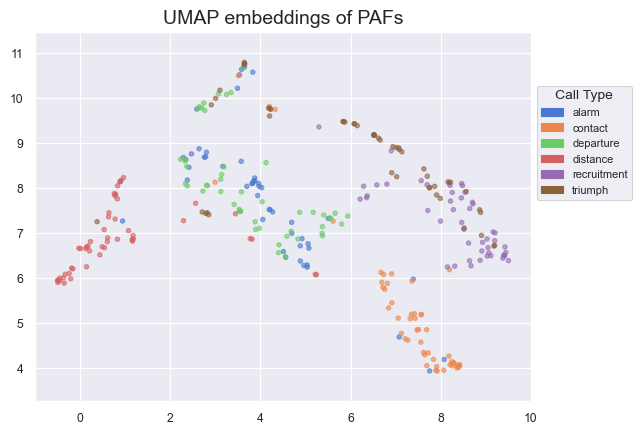

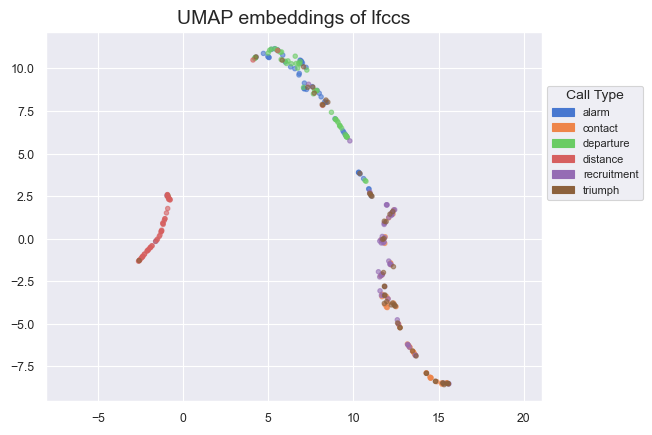

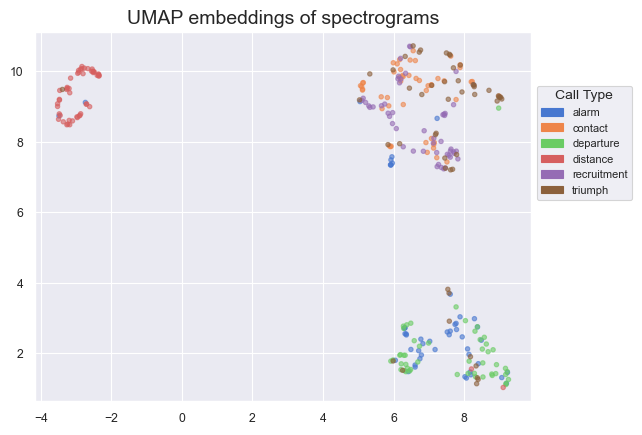

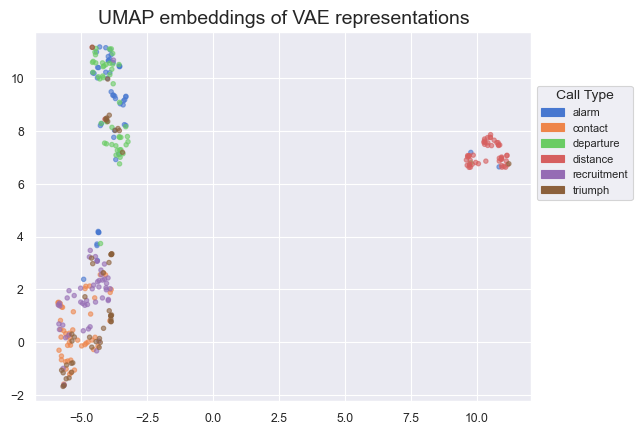

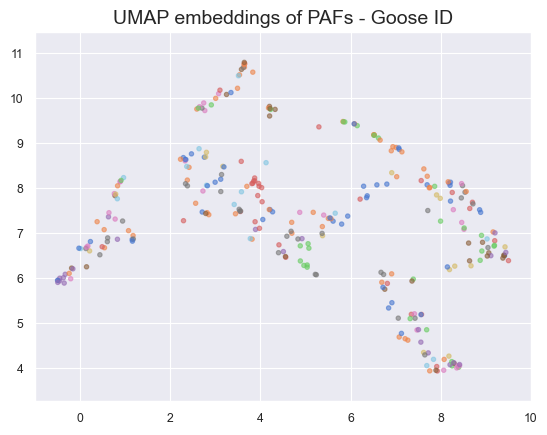

...

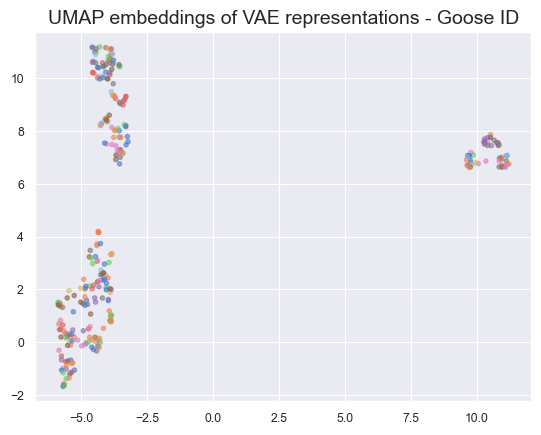

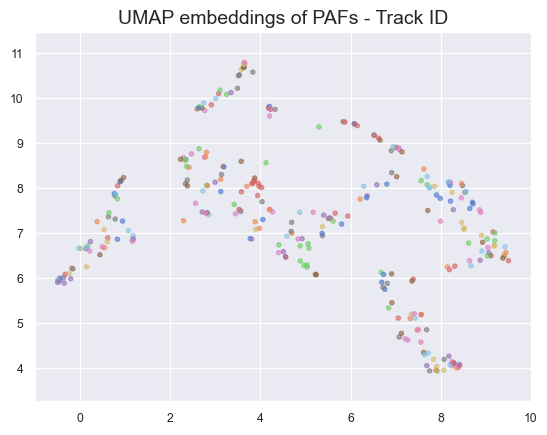

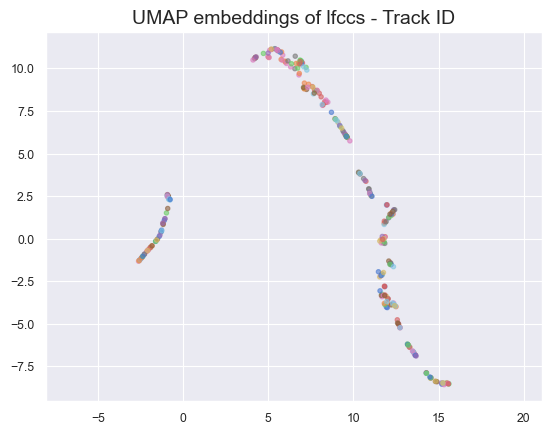

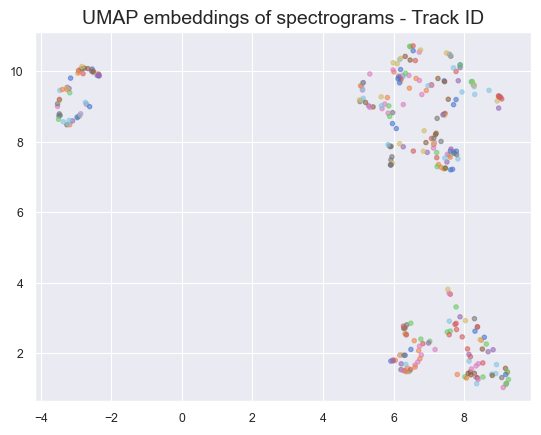

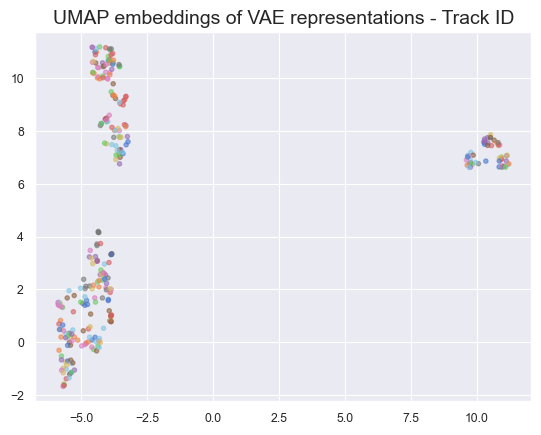

100%|██████████| 50/50 [06:13<00:00,  7.47s/it]


50 manhattan


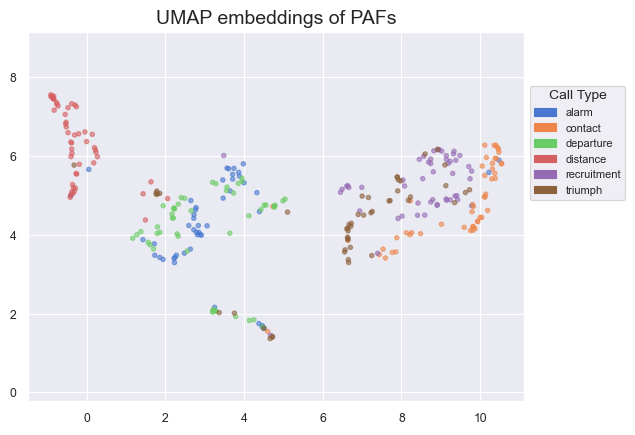

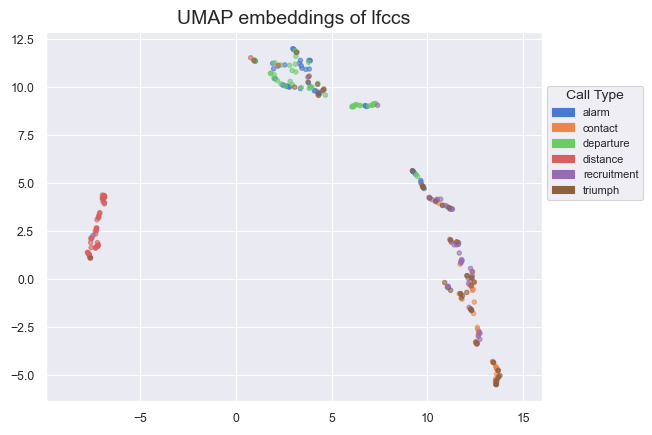

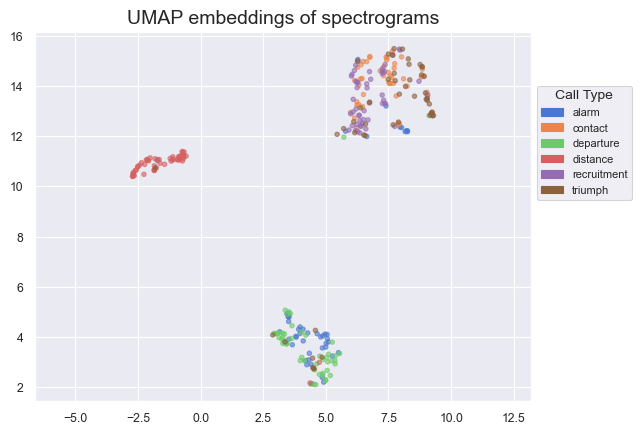

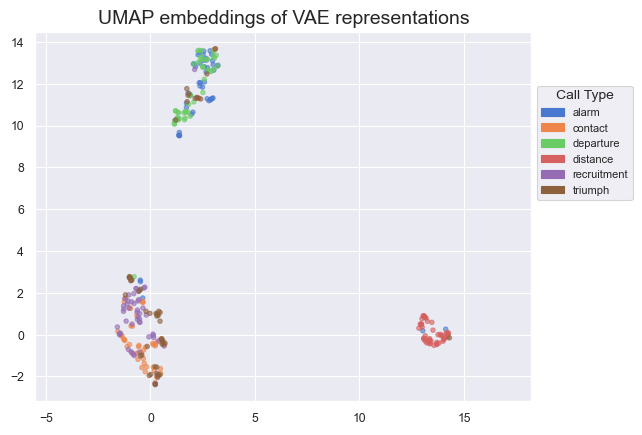

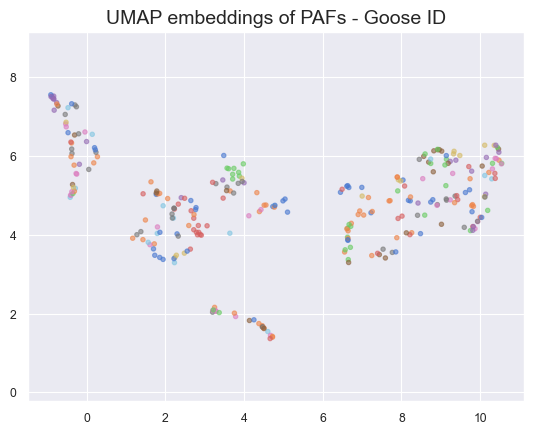

...

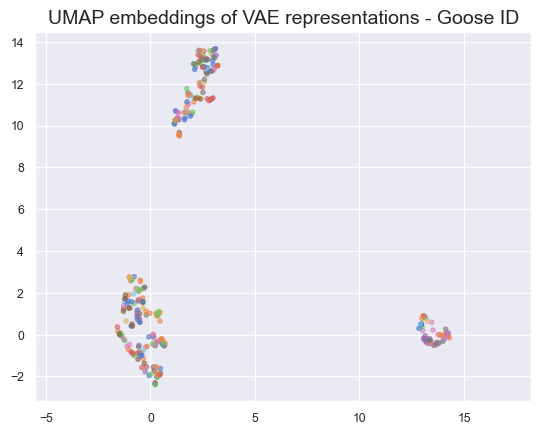

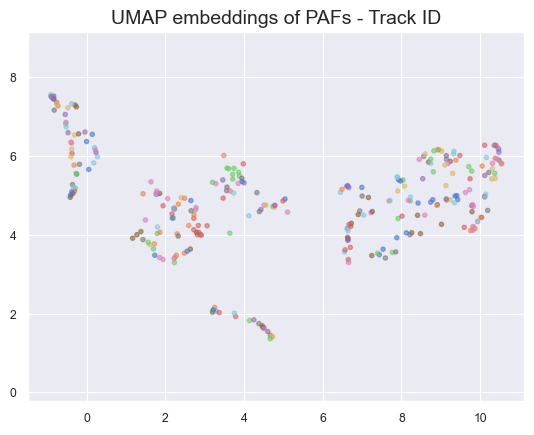

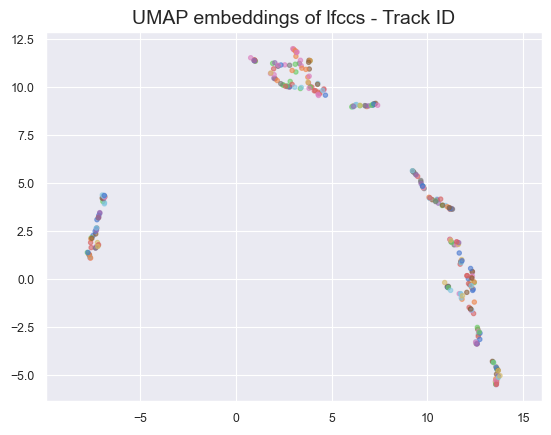

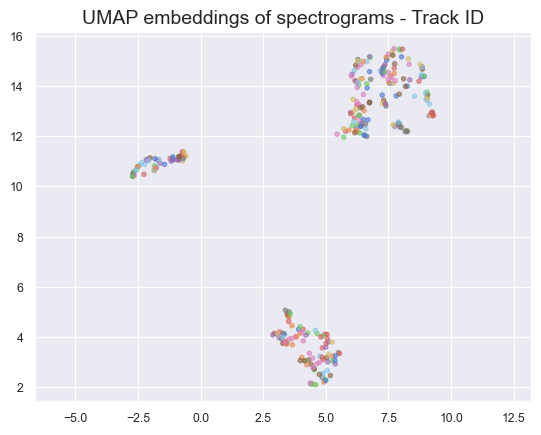

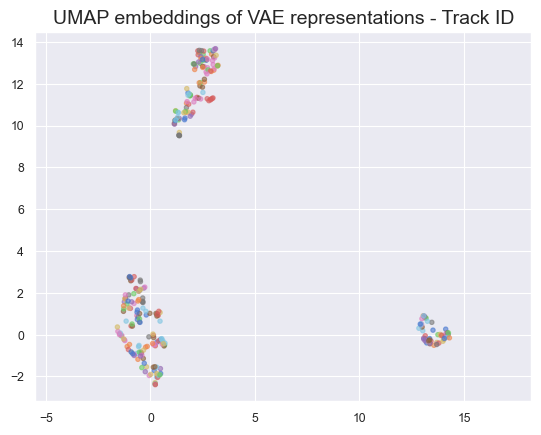

100%|██████████| 50/50 [14:09<00:00, 16.98s/it]


100 euclidean


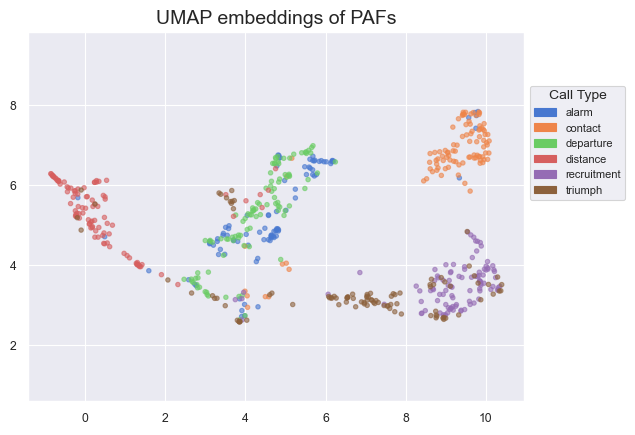

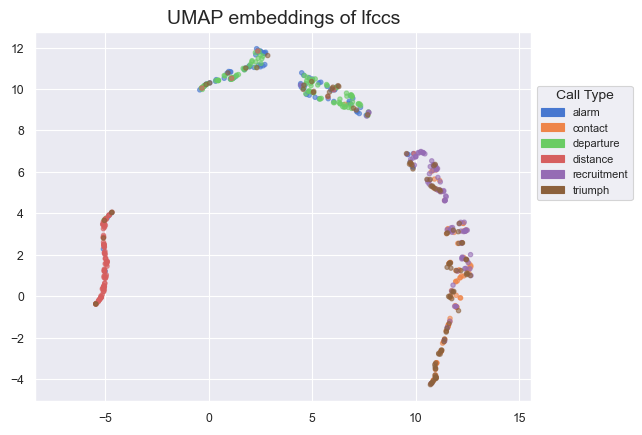

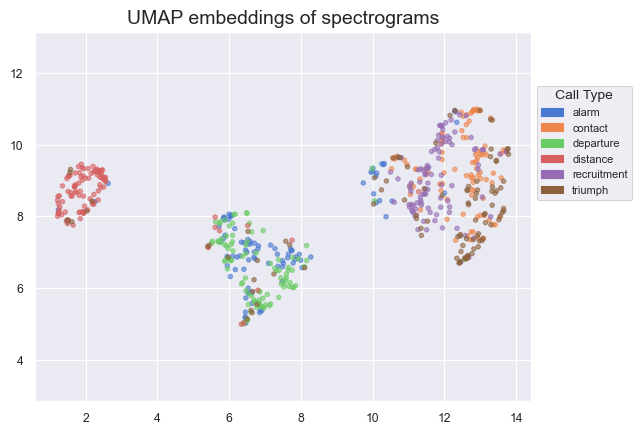

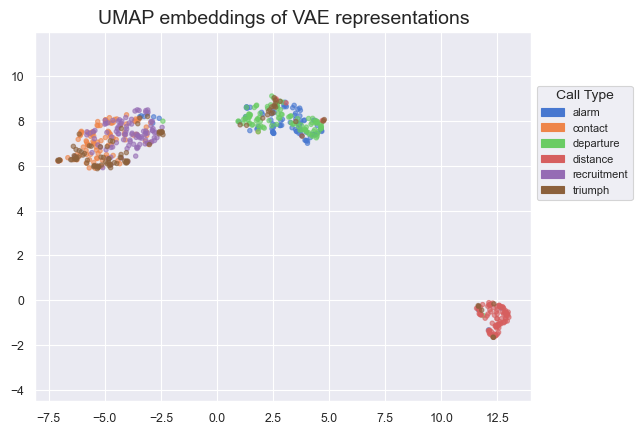

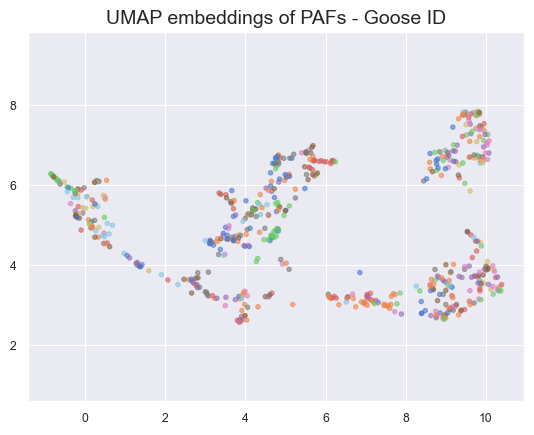

...

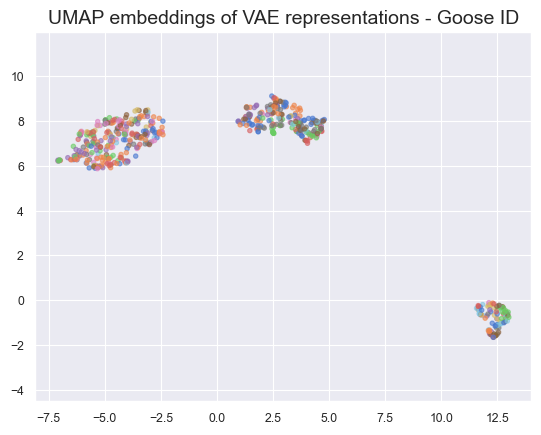

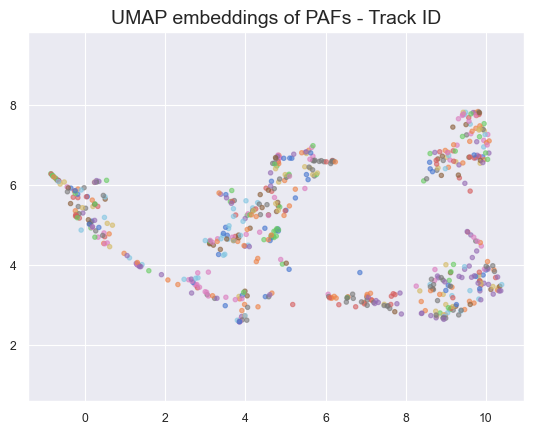

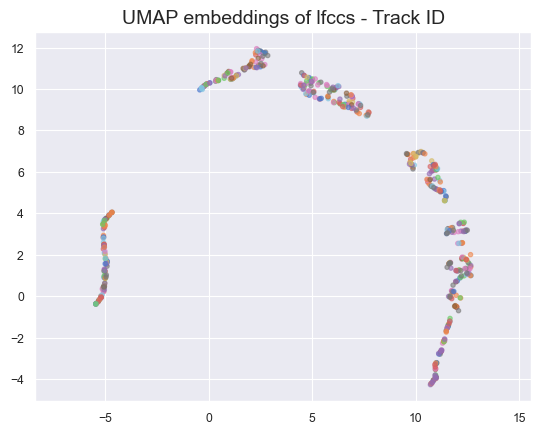

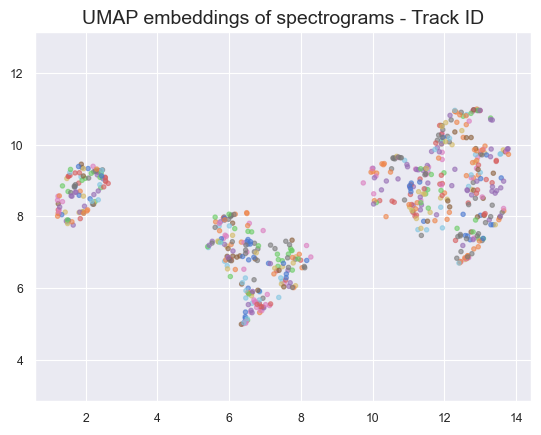

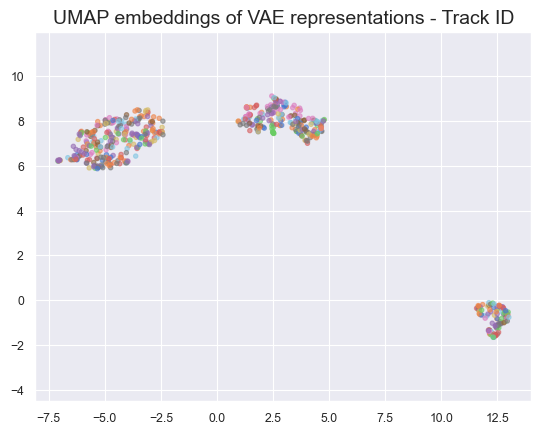

100%|██████████| 50/50 [18:29<00:00, 22.20s/it]


100 manhattan


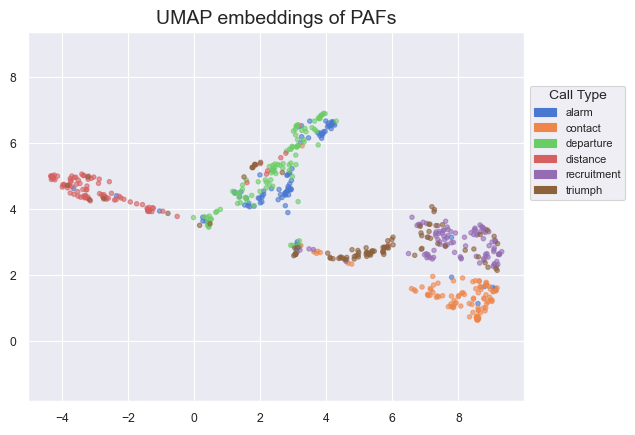

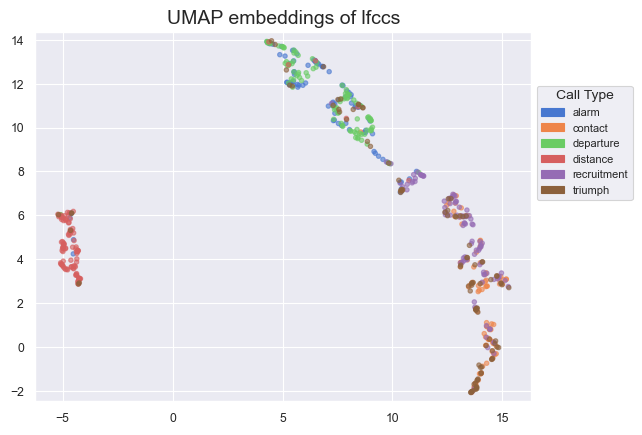

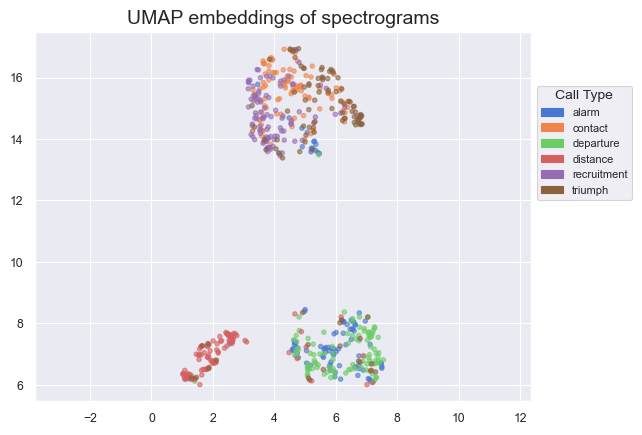

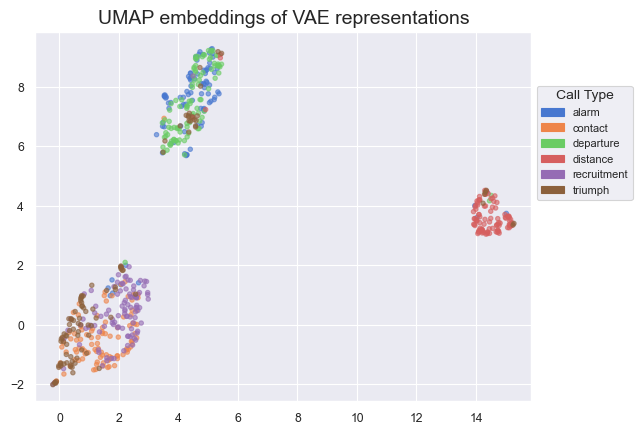

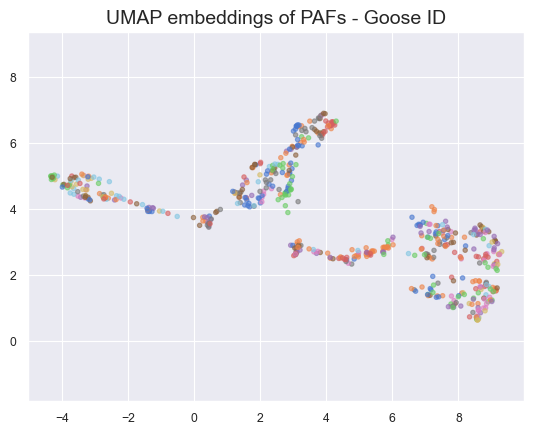

...

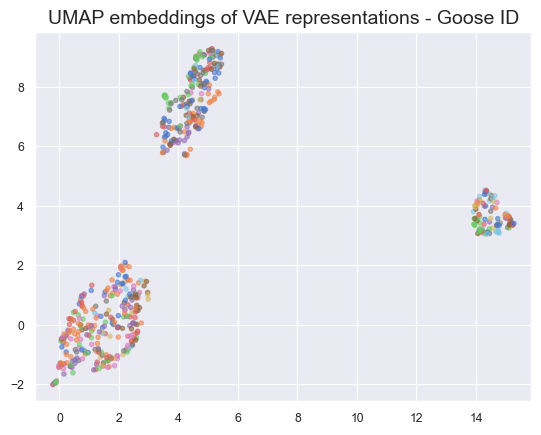

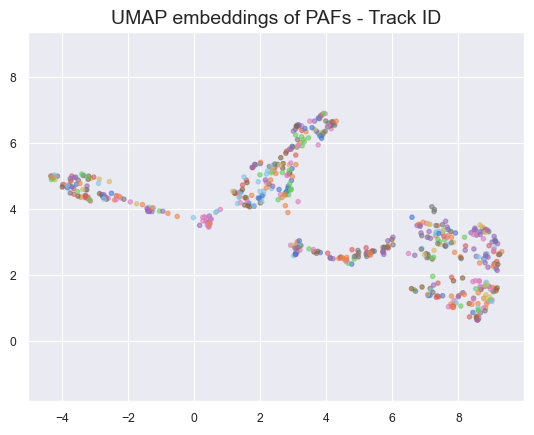

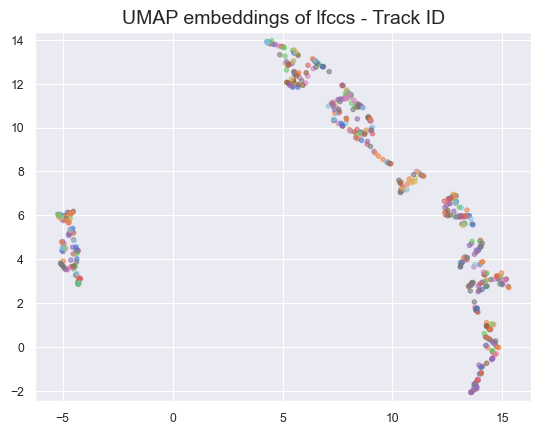

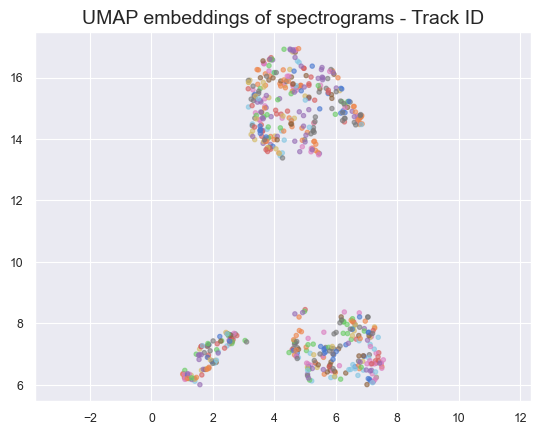

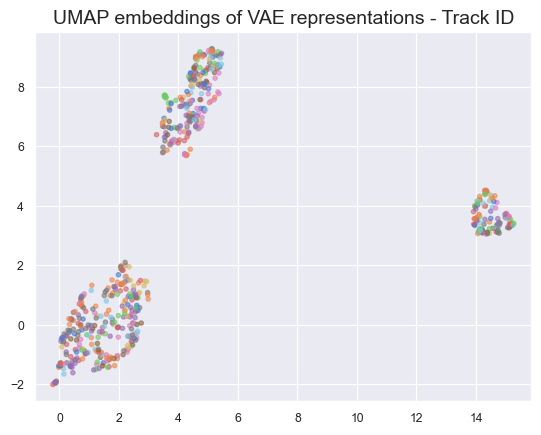

100%|██████████| 50/50 [26:34<00:00, 31.88s/it]


200 euclidean


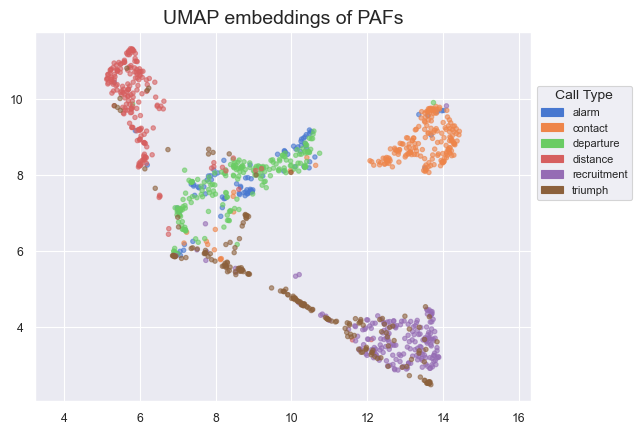

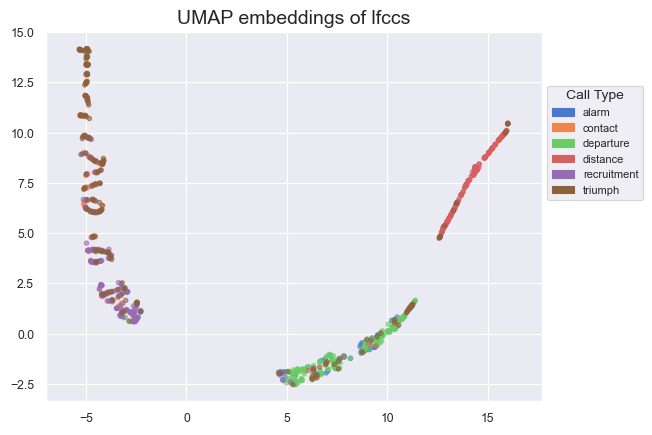

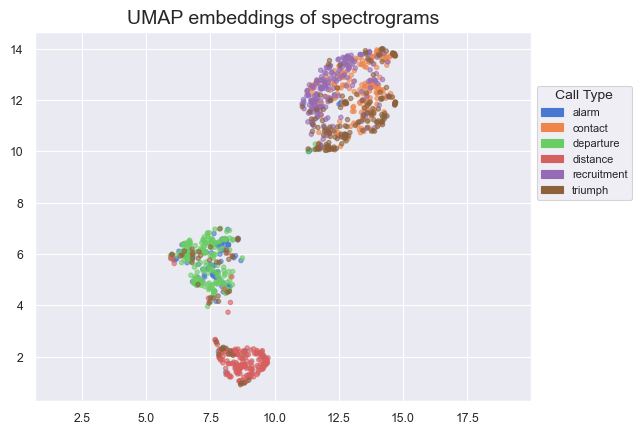

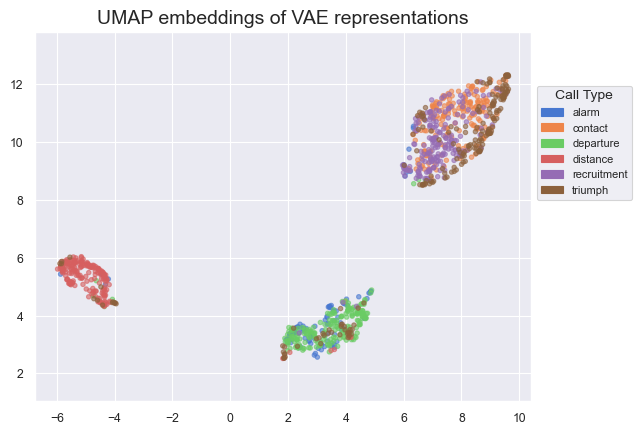

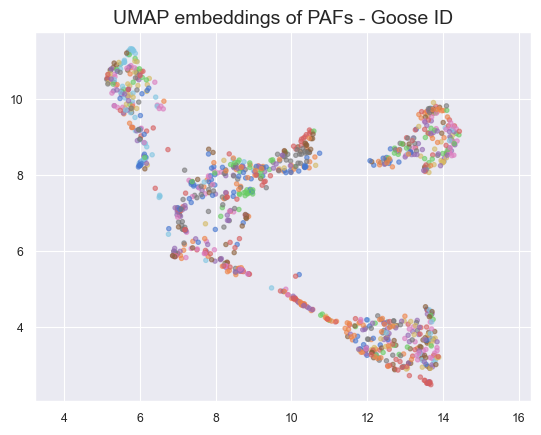

...

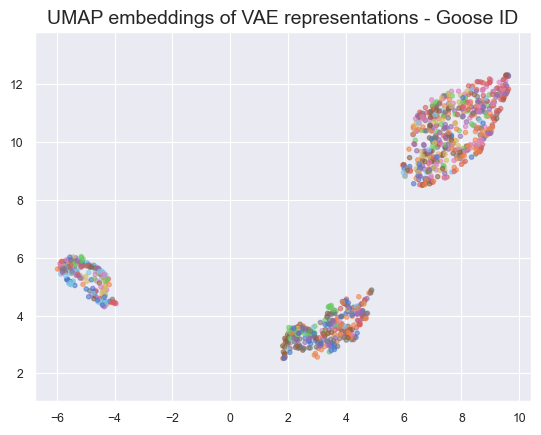

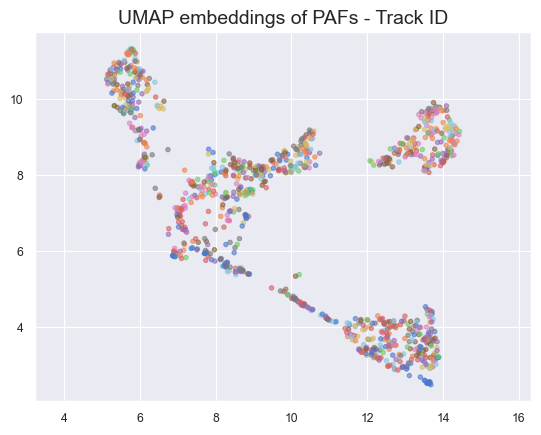

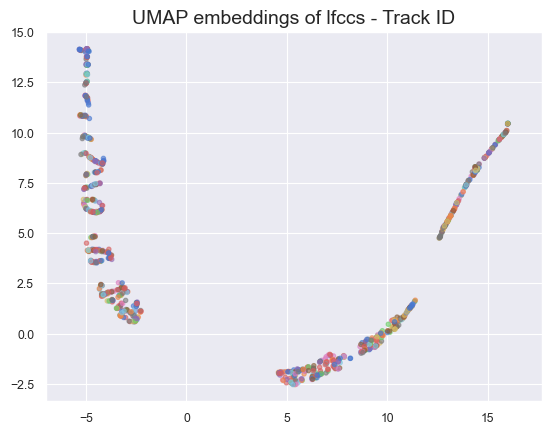

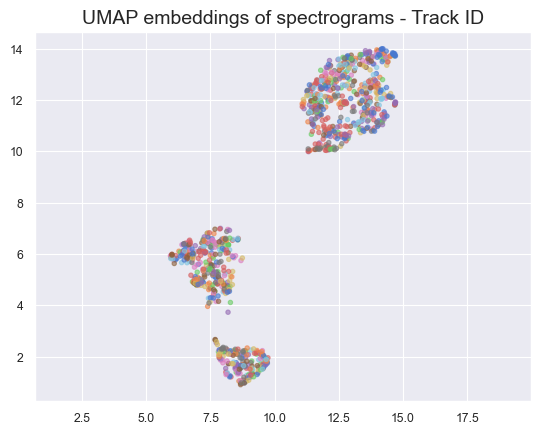

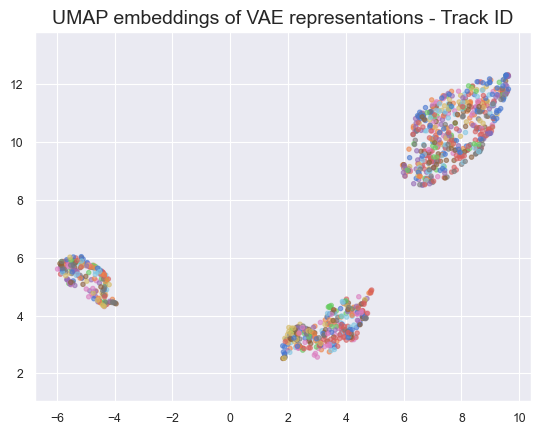

100%|██████████| 50/50 [19:55<00:00, 23.90s/it]

200 manhattan


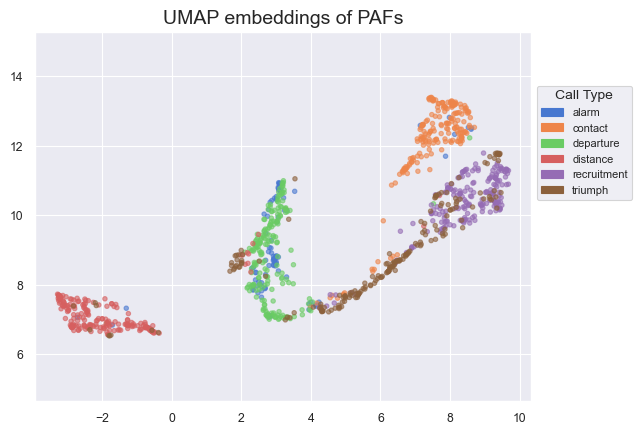

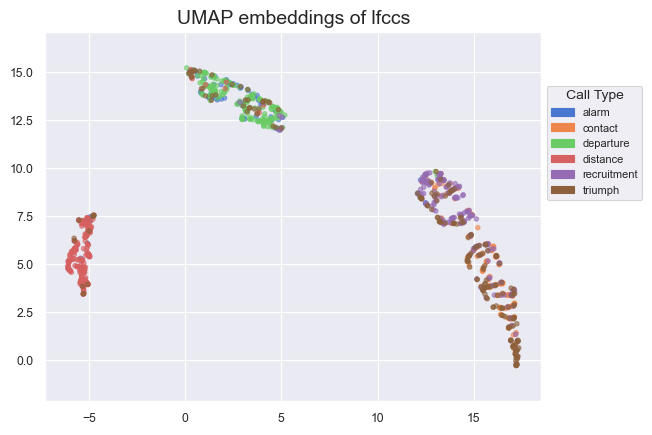

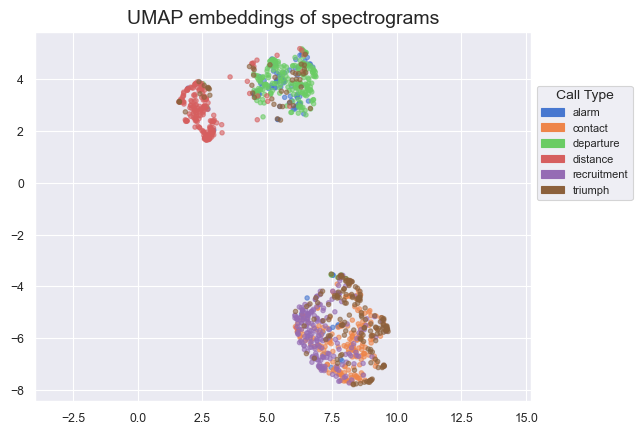

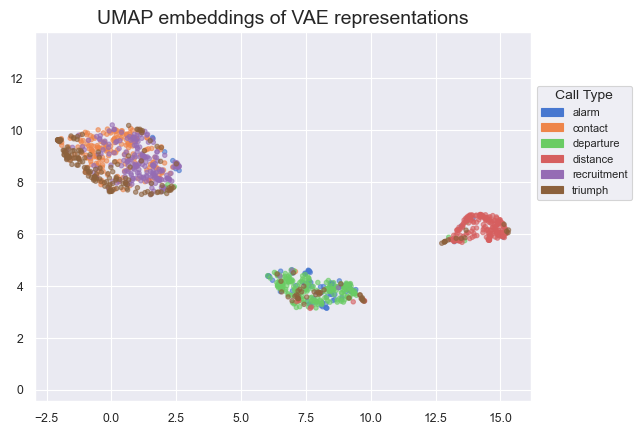

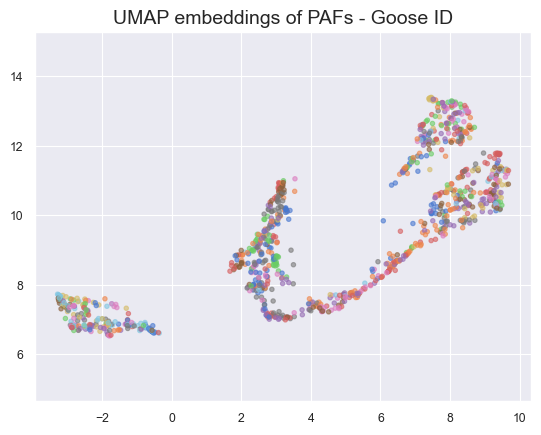

...

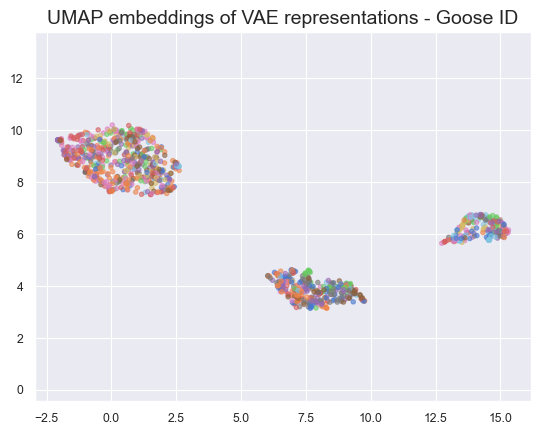

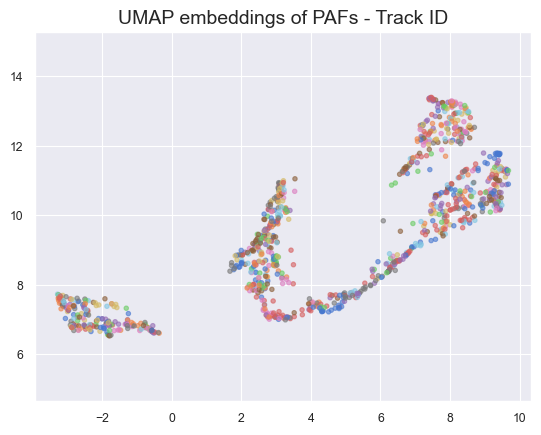

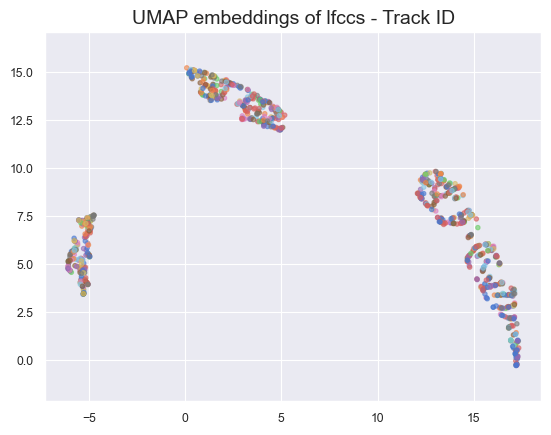

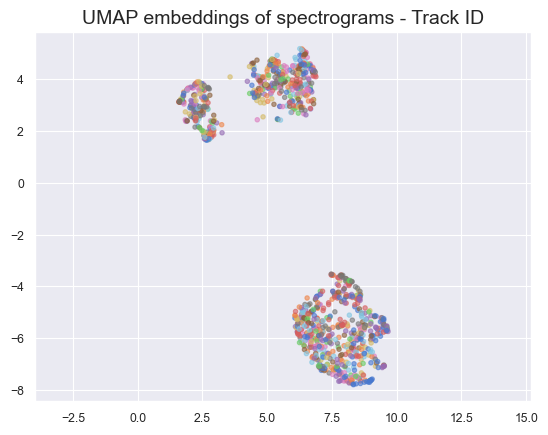

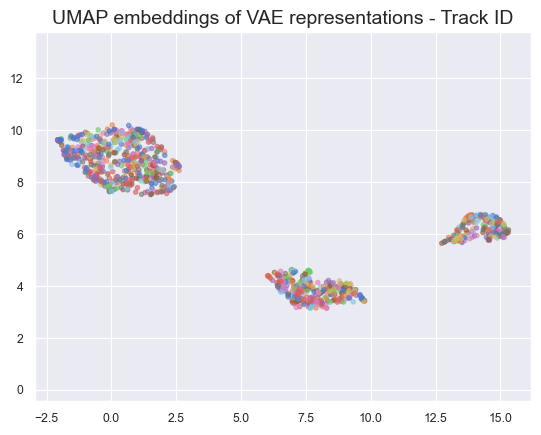

100%|██████████| 50/50 [1:22:50<00:00, 99.41s/it] 

500 euclidean


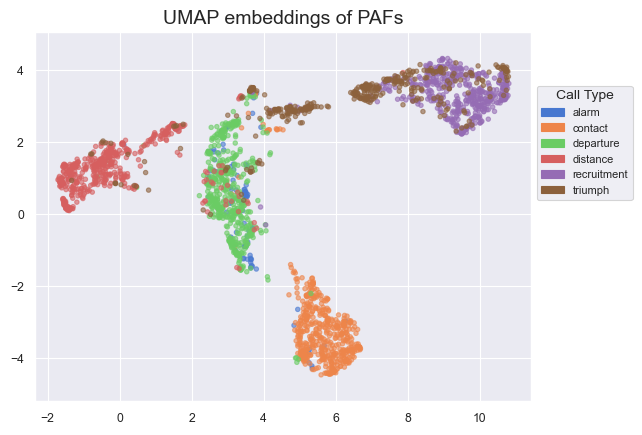

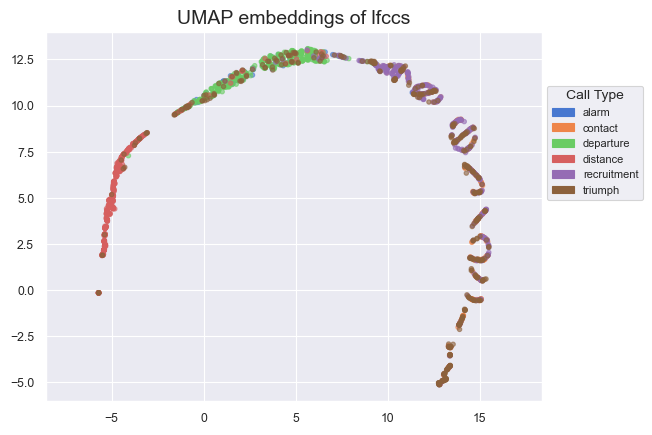

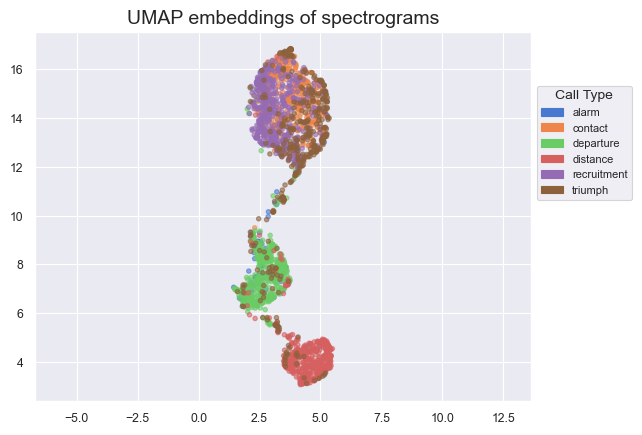

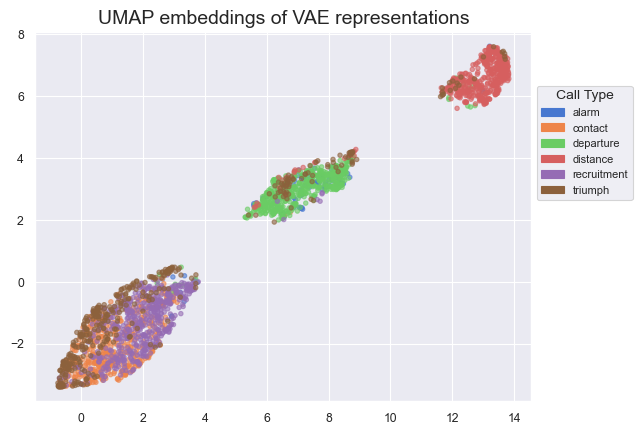

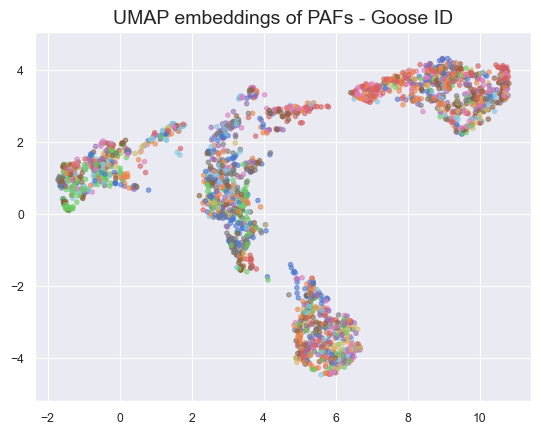

...

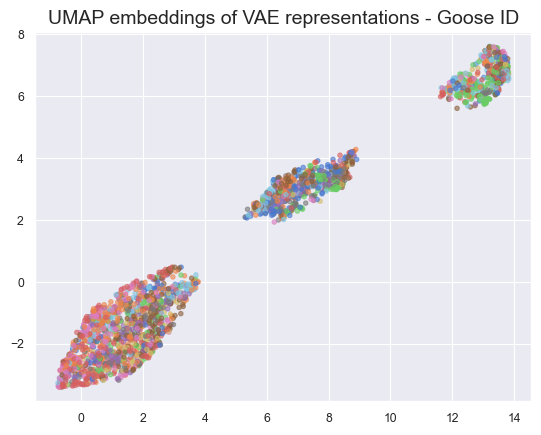

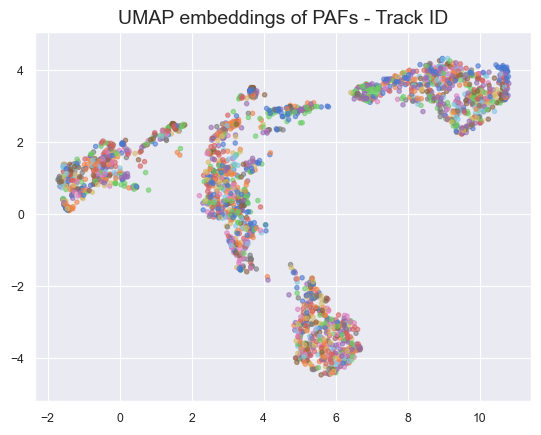

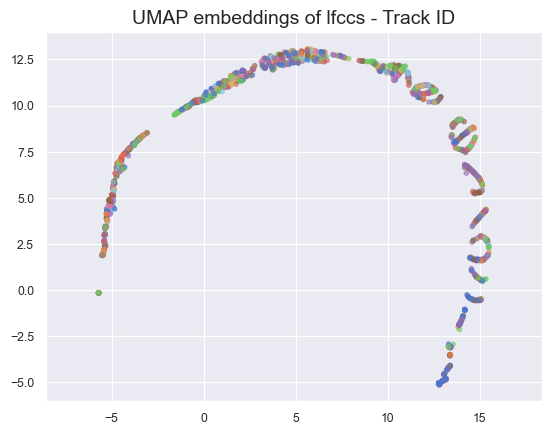

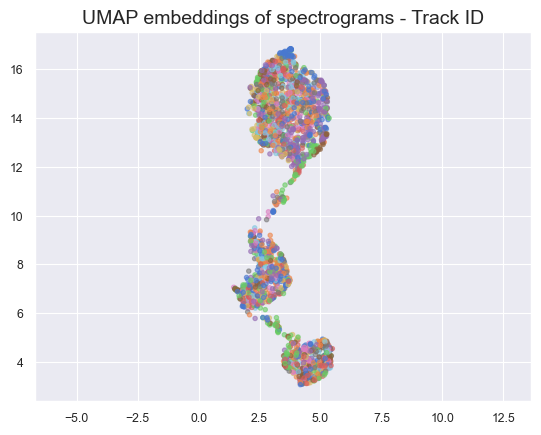

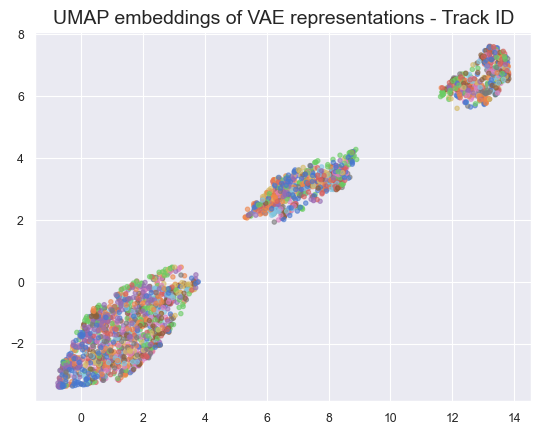

100%|██████████| 50/50 [1:25:21<00:00, 102.43s/it]

500 manhattan


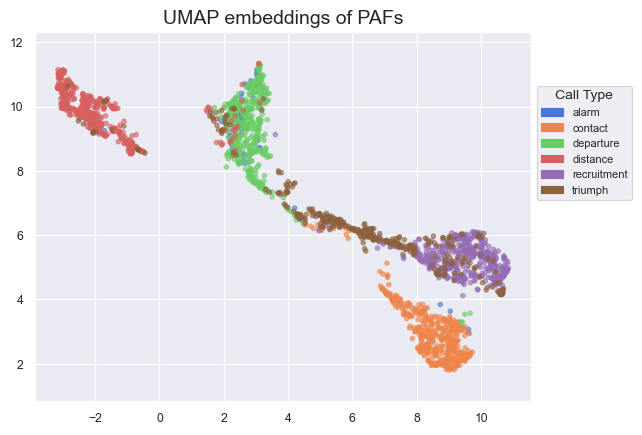

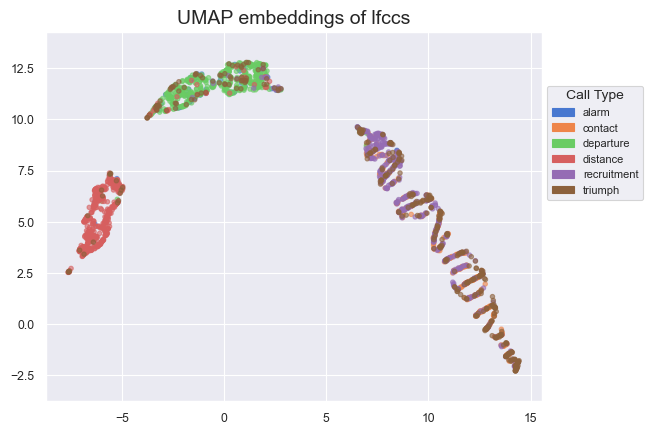

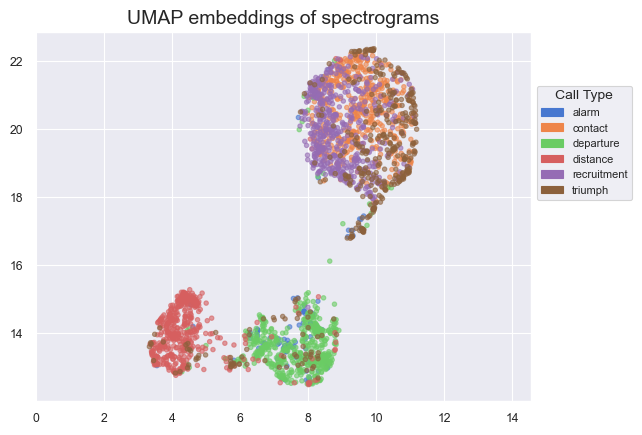

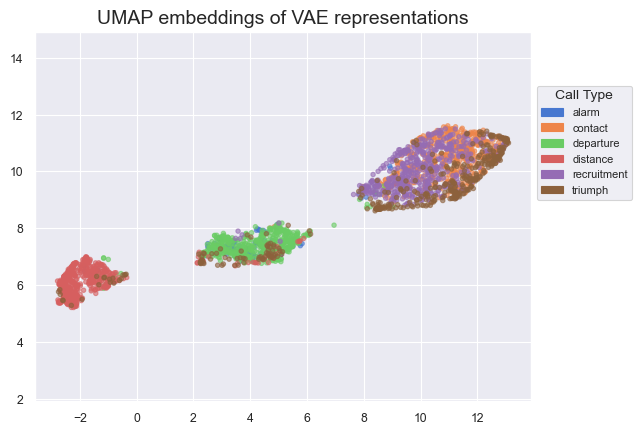

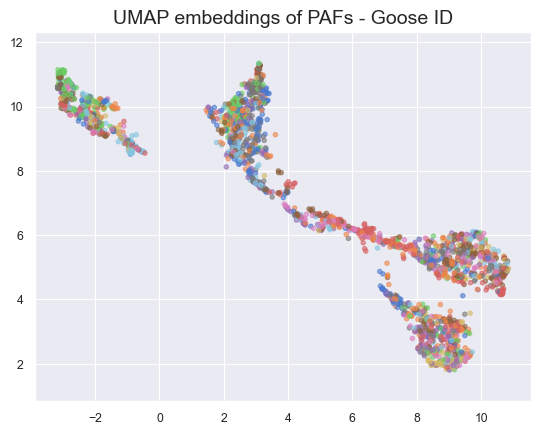

...

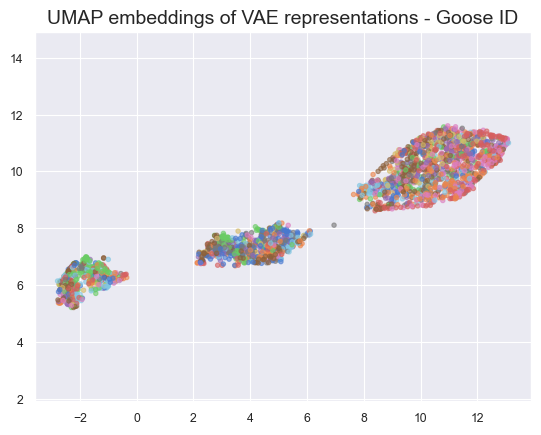

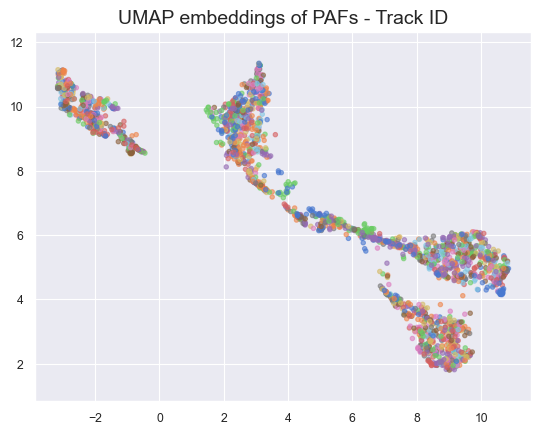

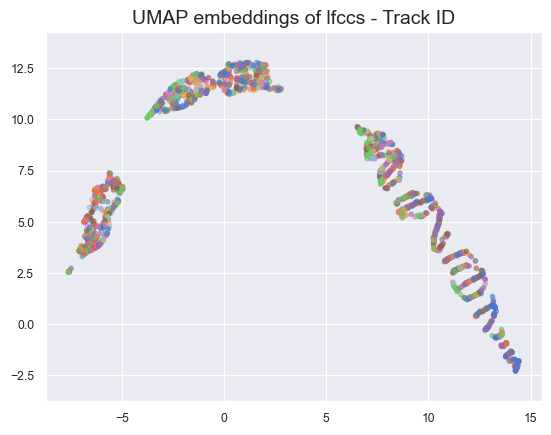

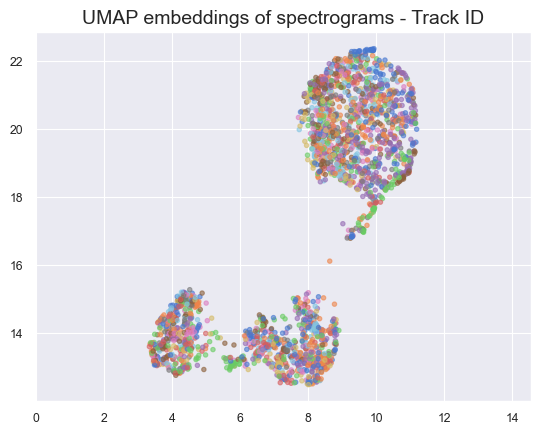

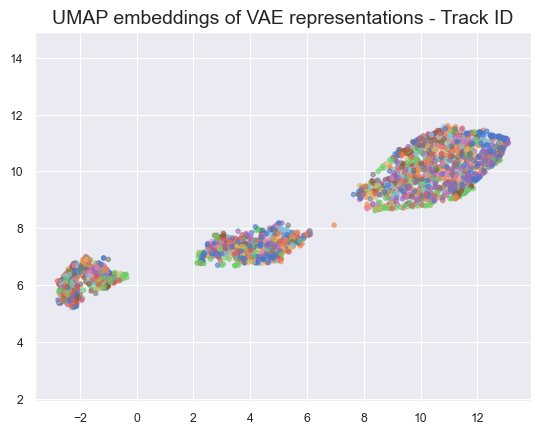

100%|██████████| 5/5 [43:41<00:00, 524.28s/it]


4000 euclidean


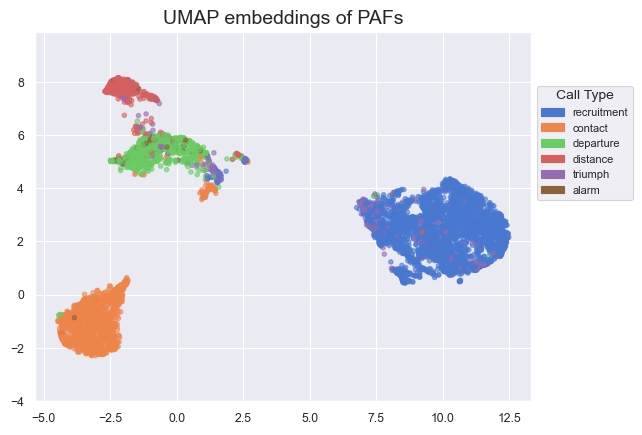

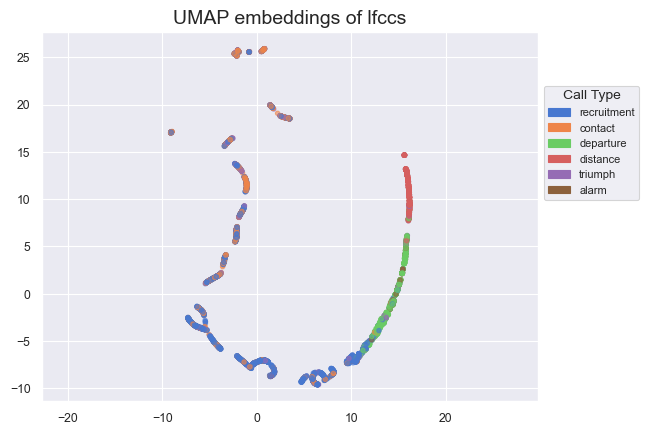

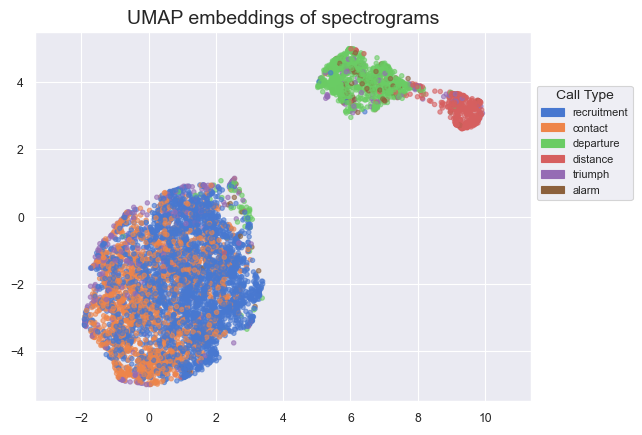

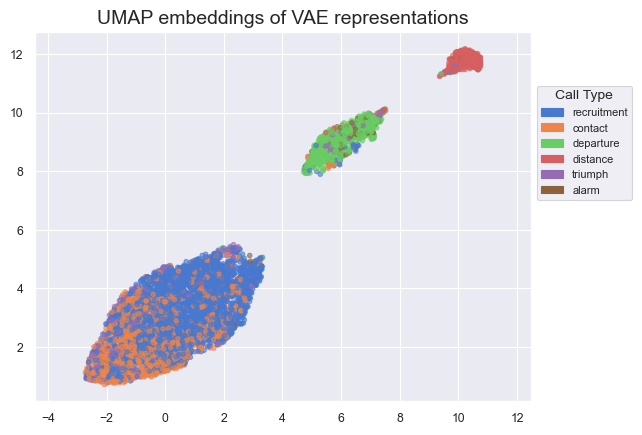

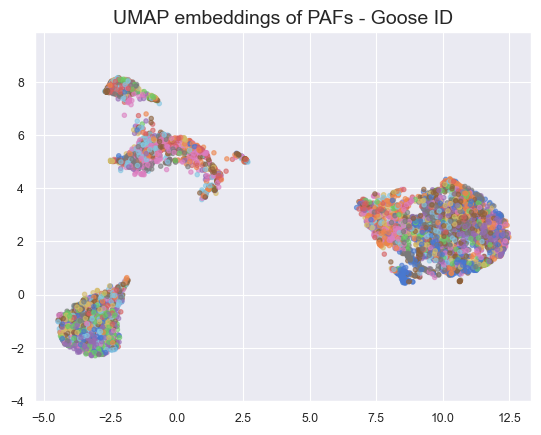

...

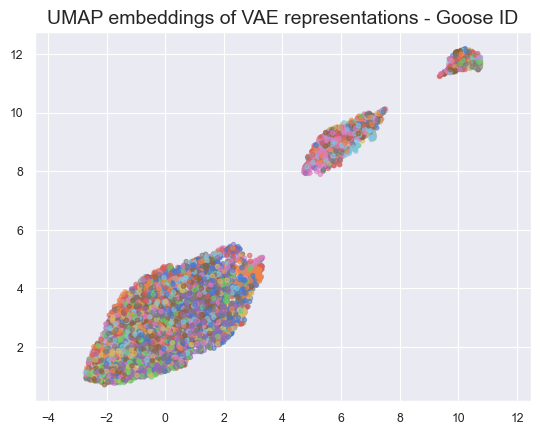

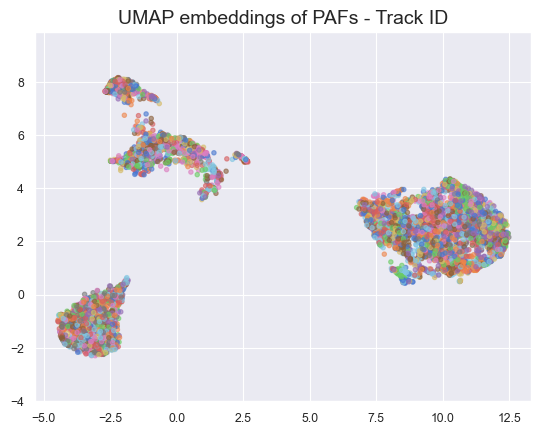

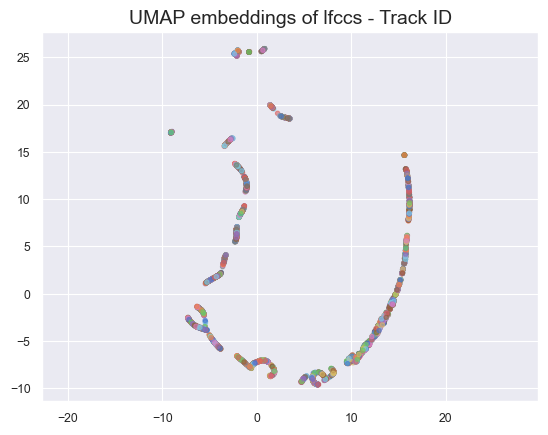

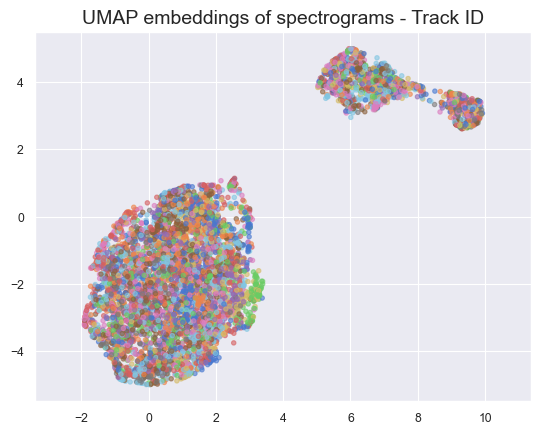

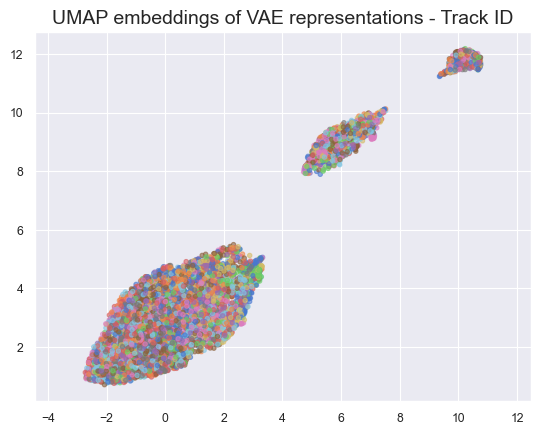

100%|██████████| 5/5 [53:13<00:00, 638.61s/it]


4000 manhattan


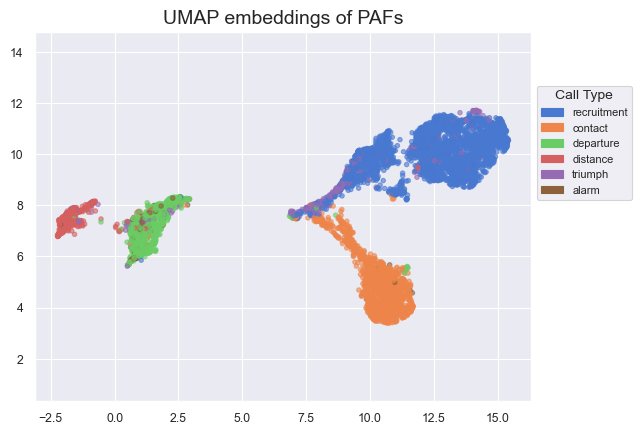

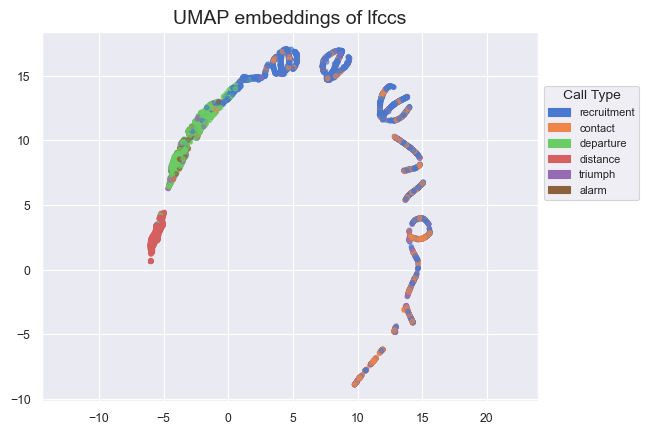

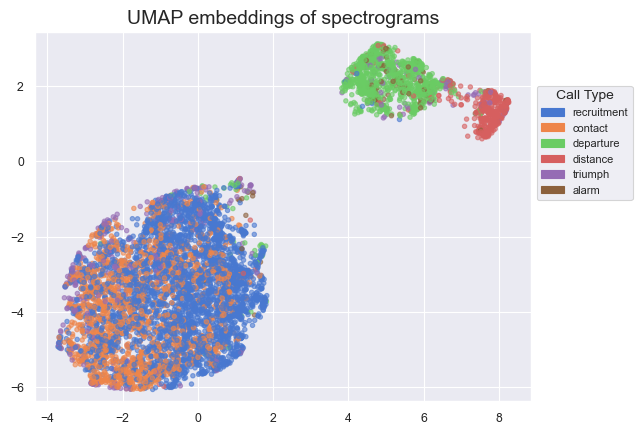

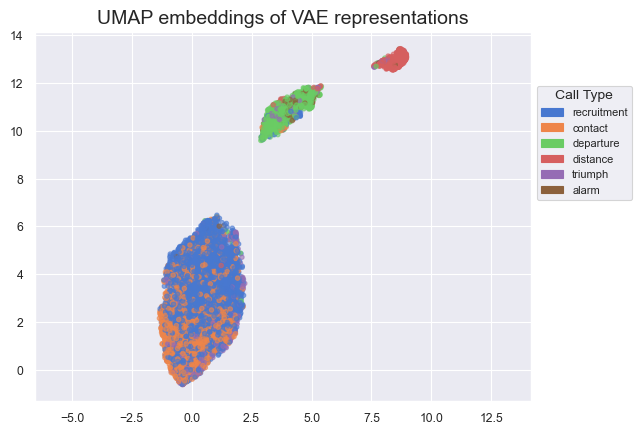

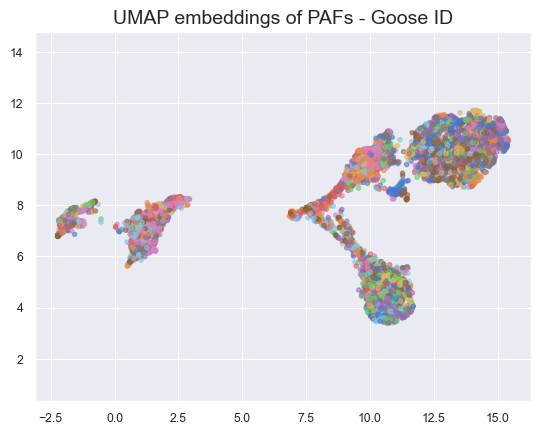

...

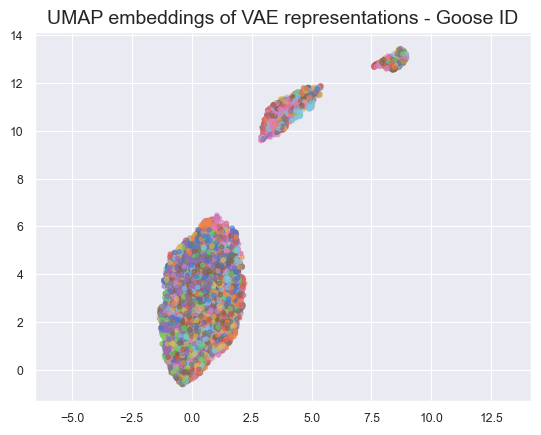

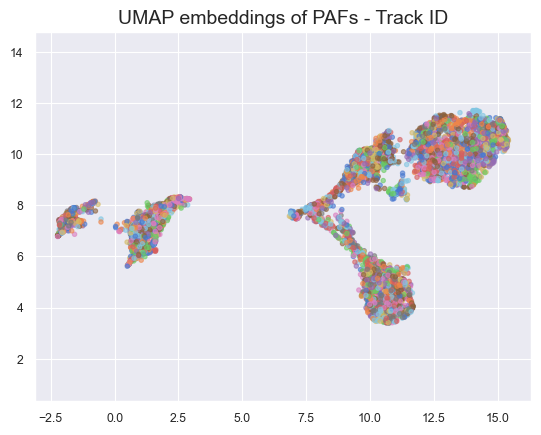

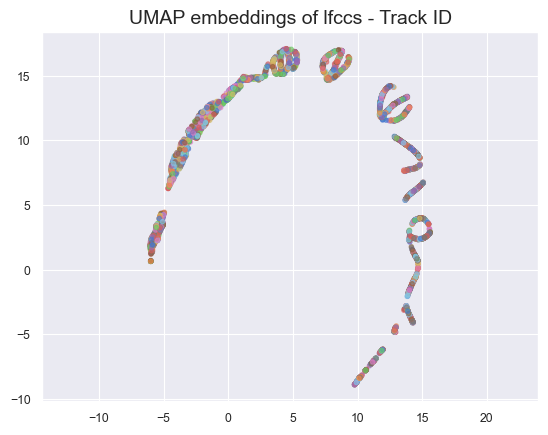

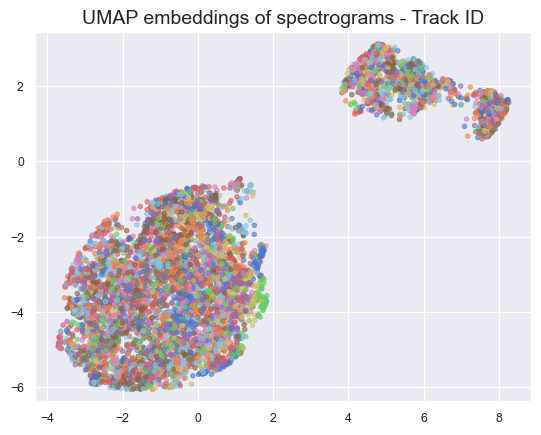

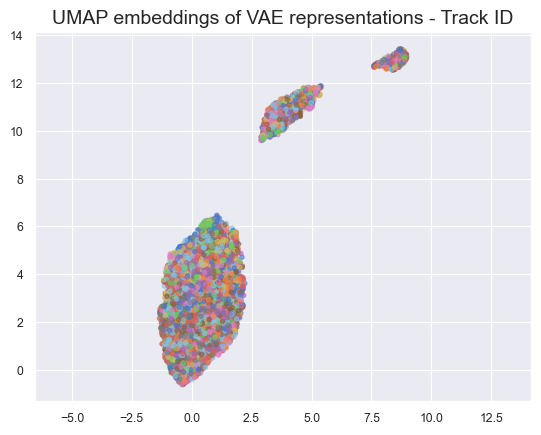

In [17]:
# run for different subset sizes
algorithms = [
            ("kMeans-preset", 0),     
            ("kMeans", 1), 
            ("HDBSCAN", 2),
            ("Leiden", 3), 
            # ("Leiden-preset", 4),
        ]
rows = []

for subset_size in [50, 100, 200, 500, 4000]:
    n_classes = 6 if subset_size <= 100 else 5
    subset_df = calls_df.copy() if subset_size <= 50 or 4000 else calls_df[calls_df["call_type"] != "alarm"].copy()
    for distance_metric in ["euclidean", "manhattan"]:
        # bootstrap dataset
        for i in tqdm(range(50) if subset_size<4000 else range(5)):
            n_neighbors = int(subset_size * NEIGHBORS_RATIO) if subset_size < 4000 else 100
            subset_df = resample_subset(subset_size, subset_df)

            # Encode call type
            le = LabelEncoder()
            le.fit(subset_df["call_type"])
            subset_df["encoded_call_type"] = le.transform(subset_df["call_type"])

            # Load representation dataframes
            paf_scaled = StandardScaler().fit_transform(subset_df.drop(columns=[col for col in calls_df.columns if col not in feature_columns_list])) #["call_type", "track_ID", "clip_ID", "goose_ID", "waveform", "sr", "filepath", "log_scaled_spectrogram", "log_padded_spectrogram", "log_padded_lfccs", "log_padded_log_freq_spectrogram", "lfccs", "log_padded_lfccs", "latent_representation", "duration_paf"]
            lfccs_scaled, lfccs_df = create_representations_subdf_and_scale(subset_df, "log_padded_lfccs")
            spectrograms_scaled, spectrograms_df = create_representations_subdf_and_scale(subset_df, "log_padded_spectrogram")
            _, vae_df = create_representations_subdf_and_scale(subset_df, "latent_representation")

            # NN Graphs
            nn_results_paf = nearest_neighbors(paf_scaled, n_neighbors=n_neighbors, metric=distance_metric, metric_kwds={}, angular=False, random_state=RANDOM_SEED, verbose=False)
            nn_results_lfcc = nearest_neighbors(lfccs_scaled, n_neighbors=n_neighbors, metric=distance_metric, metric_kwds={}, angular=False, random_state=RANDOM_SEED, verbose=False)
            nn_results_spec = nearest_neighbors(spectrograms_scaled, n_neighbors=n_neighbors, metric=distance_metric, metric_kwds={}, angular=False, random_state=RANDOM_SEED, verbose=False)
            nn_results_vae = nearest_neighbors(vae_df.drop(columns=["call_type", "track_ID", "goose_ID"]), n_neighbors=n_neighbors, metric=distance_metric, metric_kwds={}, angular=False, random_state=RANDOM_SEED, verbose=False)
            
            # Reduce dimensionality
            embeddings_paf = umap.UMAP(precomputed_knn=nn_results_paf, n_neighbors=n_neighbors, n_components=2, min_dist=0, random_state=RANDOM_SEED, n_jobs=1).fit_transform(paf_scaled)
            embeddings_lfcc = umap.UMAP(precomputed_knn=nn_results_lfcc, n_neighbors=n_neighbors, n_components=2, min_dist=0, random_state=RANDOM_SEED, n_jobs=1).fit_transform(lfccs_scaled)
            embeddings_spec = umap.UMAP(precomputed_knn=nn_results_spec, n_neighbors=n_neighbors, n_components=2, min_dist=0, random_state=RANDOM_SEED, n_jobs=1).fit_transform(spectrograms_scaled)
            embeddings_vae = umap.UMAP(precomputed_knn=nn_results_vae, n_neighbors=n_neighbors, n_components=2, min_dist=0, random_state=RANDOM_SEED, n_jobs=1).fit_transform(vae_df.drop(columns=["call_type", "track_ID", "goose_ID"]))

            trustworthiness_paf = trustworthiness(paf_scaled, embeddings_paf, n_neighbors=n_neighbors)
            trustworthiness_lfcc = trustworthiness(lfccs_scaled, embeddings_lfcc, n_neighbors=n_neighbors)
            trustworthiness_spec = trustworthiness(spectrograms_scaled, embeddings_spec, n_neighbors=n_neighbors)
            trustworthiness_vae = trustworthiness(vae_df.drop(columns=["call_type", "track_ID", "goose_ID"]), embeddings_vae, n_neighbors=n_neighbors)
            # print(f"Trustworthiness PAF: {trustworthiness_paf:.2f}")
            # print(f"Trustworthiness lfcc: {trustworthiness_lfcc:.2f}")
            # print(f"Trustworthiness spec: {trustworthiness_spec:.2f}")
            # print(f"Trustworthiness VAE: {trustworthiness_vae:.2f}")

            continuity_paf = continuity(paf_scaled, embeddings_paf, n_neighbors=n_neighbors, input_metric="euclidean")
            continuity_lfcc = continuity(lfccs_scaled, embeddings_lfcc, n_neighbors=n_neighbors, input_metric="euclidean")
            continuity_spec = continuity(spectrograms_scaled, embeddings_spec, n_neighbors=n_neighbors, input_metric="euclidean")
            continuity_vae = continuity(vae_df.drop(columns=["call_type", "track_ID", "goose_ID"]), embeddings_vae, n_neighbors=n_neighbors, input_metric="euclidean")
            # print(f"Trustworthiness PAF: {continuity_paf:.2f}")
            # print(f"Trustworthiness lfcc: {continuity_lfcc:.2f}")
            # print(f"Trustworthiness spec: {continuity_spec:.2f}")
            # print(f"Trustworthiness VAE: {continuity_vae:.2f}")

            # Cluster
            # kMeans preset
            _, _, labels_kMeans_preset_paf = clustering.silhouette_analysis_kmeans(embeddings_paf, range_n_clusters=[n_classes], plot_best_clustering=False)
            _, _, labels_kMeans_preset_lfcc = clustering.silhouette_analysis_kmeans(embeddings_lfcc, range_n_clusters=[n_classes], plot_best_clustering=False)
            _, _, labels_kMeans_preset_spec = clustering.silhouette_analysis_kmeans(embeddings_spec, range_n_clusters=[n_classes], plot_best_clustering=False)
            _, _, labels_kMeans_preset_vae = clustering.silhouette_analysis_kmeans(embeddings_vae, range_n_clusters=[n_classes], plot_best_clustering=False)

            # kMeans
            _, _, labels_kMeans_paf = clustering.silhouette_analysis_kmeans(embeddings_paf, plot_best_clustering=False)
            _, _, labels_kMeans_lfcc = clustering.silhouette_analysis_kmeans(embeddings_lfcc, plot_best_clustering=False)
            _, _, labels_kMeans_spec = clustering.silhouette_analysis_kmeans(embeddings_spec, plot_best_clustering=False)
            _, _, labels_kMeans_vae = clustering.silhouette_analysis_kmeans(embeddings_vae, plot_best_clustering=False)

            # HDBSCAN
            _, _, labels_HDBSCAN_paf = clustering.silhouette_analysis_hdbscan(embeddings_paf, plot_best_clustering=False)
            _, _, labels_HDBSCAN_lfcc = clustering.silhouette_analysis_hdbscan(embeddings_lfcc, plot_best_clustering=False)
            _, _, labels_HDBSCAN_spec = clustering.silhouette_analysis_hdbscan(embeddings_spec, plot_best_clustering=False)
            _, _, labels_HDBSCAN_vae = clustering.silhouette_analysis_hdbscan(embeddings_vae, plot_best_clustering=False)

            # Leiden
            labels_Leiden_paf, partition_paf, ig_graph_paf = clustering.leiden_cluster_from_nn_graph(nn_results_paf)
            labels_Leiden_lfcc, partition_lfcc, ig_graph_lfcc = clustering.leiden_cluster_from_nn_graph(nn_results_lfcc)
            labels_Leiden_spec, partition_spec, ig_graph_spec = clustering.leiden_cluster_from_nn_graph(nn_results_spec)
            labels_Leiden_vae, partition_vae, ig_graph_vae = clustering.leiden_cluster_from_nn_graph(nn_results_vae)
            # _, _, labels_Leiden_paf, partition_paf = clustering.modularity_analysis_leiden(nn_results_paf, subset_df, "leiden_cluster_paf", embeddings=embeddings_paf, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_lfcc, partition_lfcc = clustering.modularity_analysis_leiden(nn_results_lfcc, subset_df, "leiden_cluster_lfcc", embeddings=embeddings_lfcc, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_spec, partition_spectrogram = clustering.modularity_analysis_leiden(nn_results_spec, subset_df, "leiden_cluster_spectrogram", embeddings=embeddings_spec, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_vae, partition_vae = clustering.modularity_analysis_leiden(nn_results_vae, subset_df, "leiden_cluster_vae", embeddings=embeddings_vae, plot_every_step=False, plot_best_clustering=False)

            # # Leiden preset
            # _, _, labels_Leiden_preset_paf, partition_paf_preset = clustering.preset_leiden(nn_results_paf, subset_df, "leiden_cluster_paf", n_classes, embeddings=embeddings_paf, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_preset_lfcc, partition_lfcc_preset = clustering.preset_leiden(nn_results_lfcc, subset_df, "leiden_cluster_lfcc", n_classes, embeddings=embeddings_lfcc, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_preset_spec, partition_spectrogram_preset = clustering.preset_leiden(nn_results_spec, subset_df, "leiden_cluster_spectrogram", n_classes, embeddings=embeddings_spec, plot_every_step=False, plot_best_clustering=False)
            # _, _, labels_Leiden_preset_vae, partition_vae_preset = clustering.preset_leiden(nn_results_vae, subset_df, "leiden_cluster_vae", n_classes, embeddings=embeddings_vae, plot_every_step=False, plot_best_clustering=False)

            # Append to results DataFrame
            representations = [
                ("PAF", embeddings_paf, partition_paf, labels_kMeans_preset_paf, labels_kMeans_paf, labels_HDBSCAN_paf, labels_Leiden_paf, trustworthiness_paf, continuity_paf, ig_graph_paf),
                ("lfcc", embeddings_lfcc, partition_lfcc, labels_kMeans_preset_lfcc, labels_kMeans_lfcc, labels_HDBSCAN_lfcc, labels_Leiden_lfcc, trustworthiness_lfcc, continuity_lfcc, ig_graph_lfcc),
                ("Spectrogram", embeddings_spec, partition_spec, labels_kMeans_preset_spec, labels_kMeans_spec, labels_HDBSCAN_spec, labels_Leiden_spec, trustworthiness_spec, continuity_spec, ig_graph_spec),
                ("VAE", embeddings_vae, partition_vae, labels_kMeans_preset_vae, labels_kMeans_vae, labels_HDBSCAN_vae, labels_Leiden_vae, trustworthiness_vae, continuity_vae, ig_graph_vae),
            ]

            for rep_name, embeddings, partition, labels_kMeans_preset, labels_kMeans, labels_HDBSCAN, labels_Leiden, trust, cont, graph in representations:
                for algorithm_name, label_index in algorithms:
                    labels = [labels_kMeans_preset, labels_kMeans, labels_HDBSCAN, labels_Leiden][label_index]

                    new_row = {
                        "Representation": rep_name,
                        "Algorithm": algorithm_name,
                        "Distance metric": distance_metric,
                        "Subset size": subset_size,
                        "N clusters": np.max(labels)+1 if labels is not None else None,
                        "V-measure": v_measure_score(subset_df["encoded_call_type"], labels) if labels is not None else None,
                        "Adj. RS": adjusted_rand_score(subset_df["encoded_call_type"], labels) if labels is not None else None,
                        "Hopkins": stats.hopkins(embeddings, RANDOM_SEED),
                        "Silhouette Score": silhouette_score(embeddings, labels) if algorithm_name in "Leiden-preset" and labels is not None else stats.silhouette_on_graph(graph, partition.membership),
                        "Modularity": partition.modularity if algorithm_name in "Leiden-preset" and partition is not None else None,
                        "Homogeneity": homogeneity_score(subset_df["encoded_call_type"], labels) if labels is not None else None,
                        "Completeness": completeness_score(subset_df["encoded_call_type"], labels) if labels is not None else None,
                        "Trustworthiness": trust, 
                        "Continuity": cont
                    }
                    rows.append(new_row)
        print(subset_size, distance_metric)
        plot_all(subset_df, embeddings_paf, embeddings_lfcc, embeddings_spec, embeddings_vae)

new_df = pd.DataFrame(rows)
if results_df.empty:
    results_df = new_df
else:
    results_df = pd.concat([results_df, new_df], ignore_index=True)

In [18]:
results_df.head()

,Representation,Algorithm,Distance metric,Subset size,N clusters,V-measure,Adj. RS,Hopkins,Silhouette Score,Modularity,Homogeneity,Completeness,Trustworthiness,Continuity
0,PAF,kMeans-preset,euclidean,50,6,0.507142,0.421229,0.918986,0.225753,NaN,0.503500,0.510838,0.951286,0.945338
1,PAF,kMeans,euclidean,50,10,0.524413,0.369335,0.918986,0.225753,NaN,0.595846,0.468274,0.951286,0.945338
2,PAF,HDBSCAN,euclidean,50,46,0.461419,0.109161,0.918986,0.225753,NaN,0.710060,0.341749,0.951286,0.945338
3,PAF,Leiden,euclidean,50,8,0.558817,0.466346,0.918986,0.442077,0.674246,0.588858,0.531693,0.951286,0.945338
4,lfcc,kMeans-preset,euclidean,50,6,0.433042,0.323114,0.987722,0.391076,NaN,0.432129,0.433959,0.986847,0.988978


In [19]:
lfccs_df.head()

,call_type,track_ID,goose_ID,0,1,2,3,4,5,6,...,3478,3479,3480,3481,3482,3483,3484,3485,3486,3487
0,recruitment,GT00780,Lando,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,recruitment,GT00772,Burglar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,contact,GT00795,EinStein,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,departure,GT00447,BruceSpringsteen,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,recruitment,GT00775,Anthony,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
spectrograms_df.head()

,call_type,track_ID,goose_ID,0,1,2,3,4,5,6,...,7382,7383,7384,7385,7386,7387,7388,7389,7390,7391
0,recruitment,GT00780,Lando,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,recruitment,GT00772,Burglar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,contact,GT00795,EinStein,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,departure,GT00447,BruceSpringsteen,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,recruitment,GT00775,Anthony,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [21]:
vae_df.head()

,call_type,track_ID,goose_ID,0,1,2,3,4,5,6,...,118,119,120,121,122,123,124,125,126,127
0,recruitment,GT00780,Lando,0.841200,0.157980,-1.051172,0.242981,-0.072820,-0.955721,0.093116,...,-0.615650,0.527519,0.469508,-0.115110,0.914650,0.439068,0.140011,0.644170,-1.661088,0.124125
1,recruitment,GT00772,Burglar,1.162585,1.297921,-1.047947,0.622518,1.109746,-0.514603,-0.266331,...,-1.032017,1.413965,0.149646,0.935834,1.569596,0.245304,-0.234843,0.294796,0.963324,0.571938
2,contact,GT00795,EinStein,0.075206,0.827018,-1.962661,0.365060,-0.845311,1.095144,1.484242,...,-0.735181,0.330313,0.657647,0.372646,2.959265,2.214891,-0.244183,-2.083017,0.438358,1.241222
3,departure,GT00447,BruceSpringsteen,0.734380,0.576029,0.560716,-0.293281,0.111362,0.057132,0.711353,...,-0.556119,-0.433829,-1.645538,-0.493104,-0.823608,0.002442,0.157189,0.037799,0.342883,-0.774785
4,recruitment,GT00775,Anthony,1.051993,0.147073,-1.476458,-1.769323,-0.497498,0.418133,0.093777,...,0.359188,0.931057,0.016131,0.184104,1.059488,1.032000,1.568444,0.832941,-1.008603,1.099767


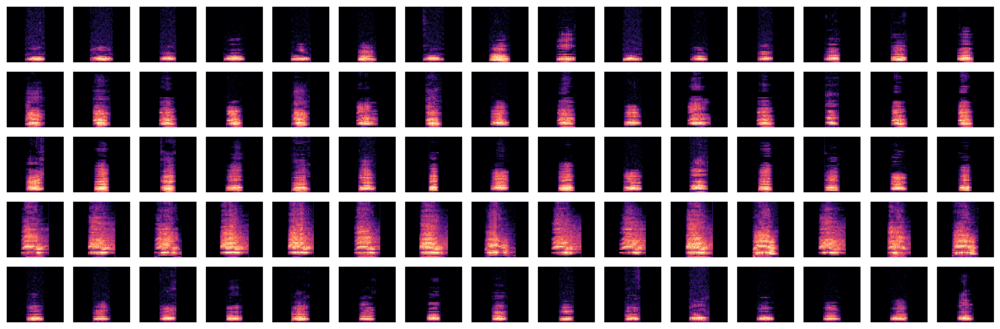

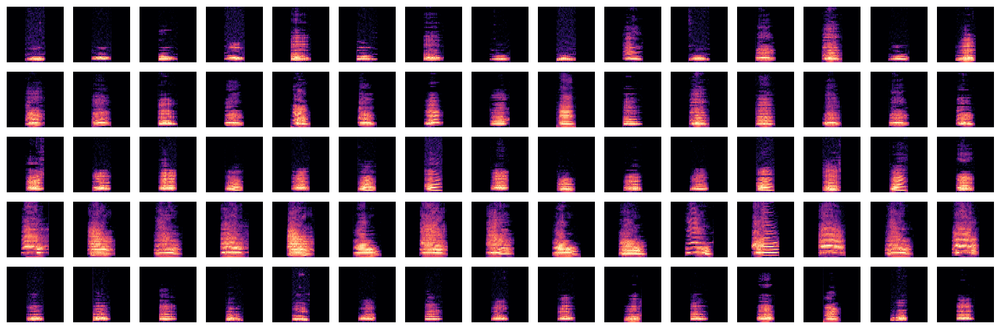

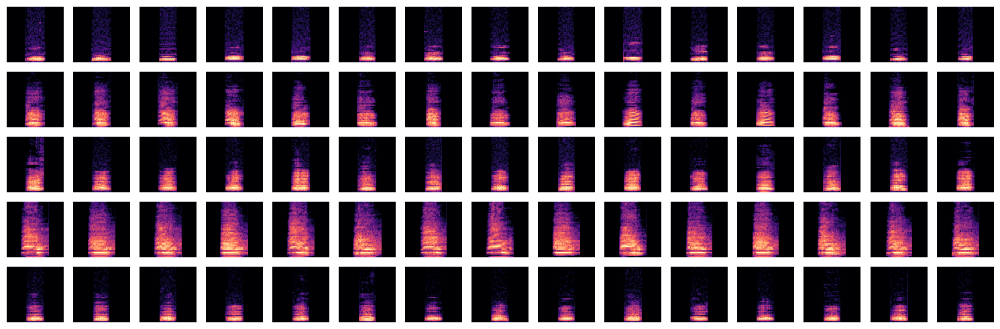

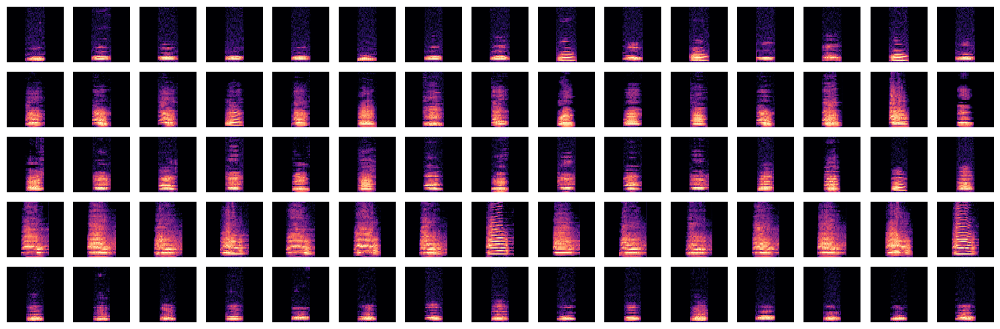

In [22]:
plotting.display_nearest_neighbours(nn_results_paf, subset_df)
plotting.display_nearest_neighbours(nn_results_lfcc, subset_df)
plotting.display_nearest_neighbours(nn_results_spec, subset_df)
plotting.display_nearest_neighbours(nn_results_vae, subset_df)

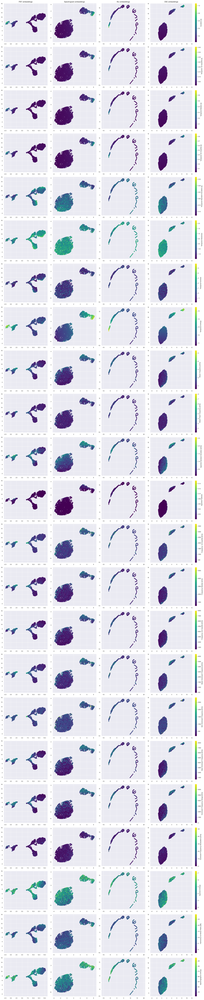

In [23]:
plotting.plot_colorcoded_features(
    feature_columns_list, 
    feature_titles_list, 
    [embeddings_paf, embeddings_spec, embeddings_lfcc, embeddings_vae], 
    ["PAF embeddings", "Spectrogram embeddings", "lfcc embeddings", "VAE embeddings"], 
    subset_df)

KeyError: 'leiden_cluster_paf'

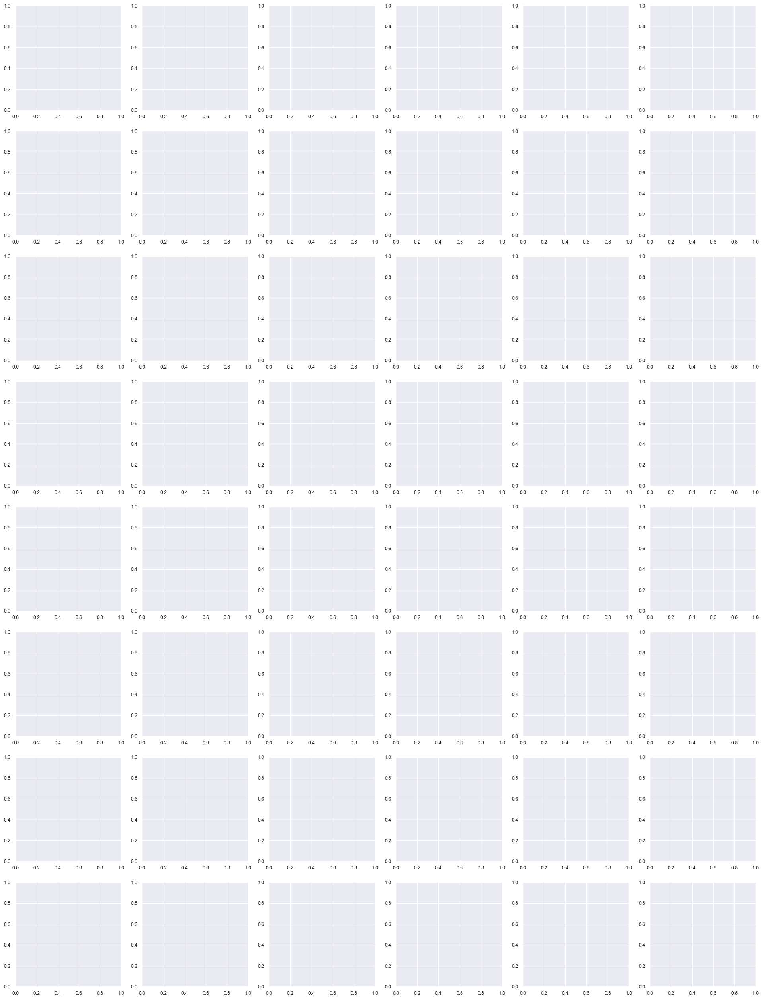

In [24]:
plotting.plot_cluster_examples("leiden_cluster_paf", np.unique(labels_Leiden_paf), subset_df)
plotting.plot_cluster_examples("leiden_cluster_lfcc", np.unique(labels_Leiden_lfcc), subset_df)
plotting.plot_cluster_examples("leiden_cluster_spectrogram", np.unique(labels_Leiden_spec), subset_df)
plotting.plot_cluster_examples("leiden_cluster_vae", np.unique(labels_Leiden_vae), subset_df)

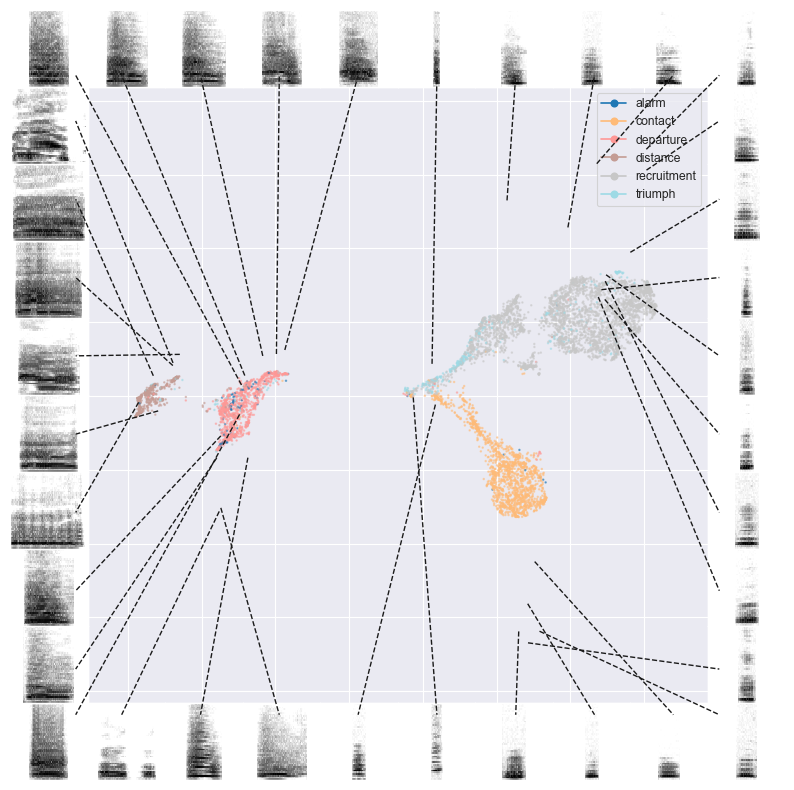

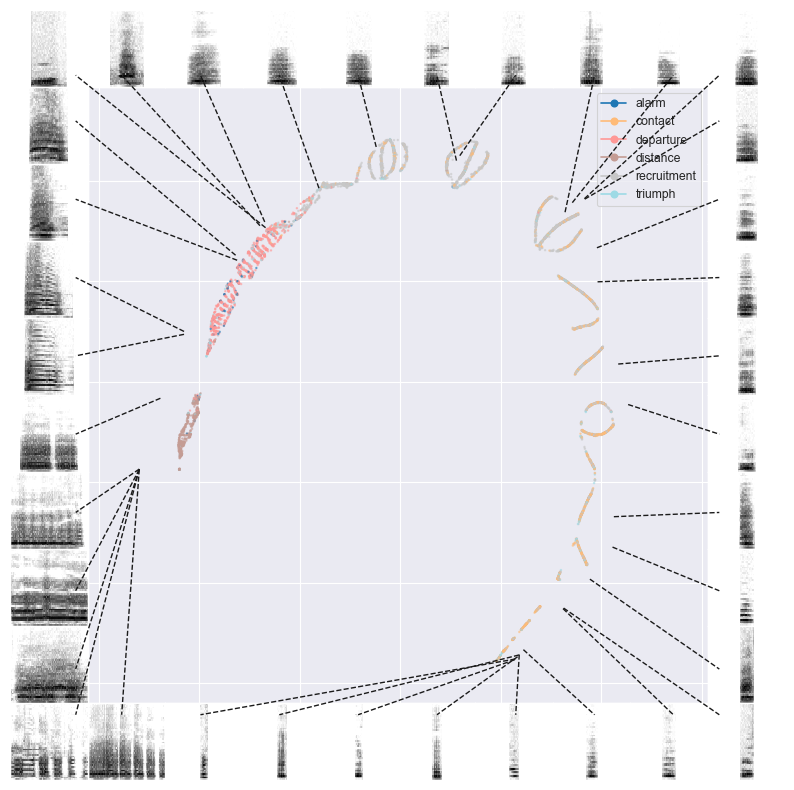

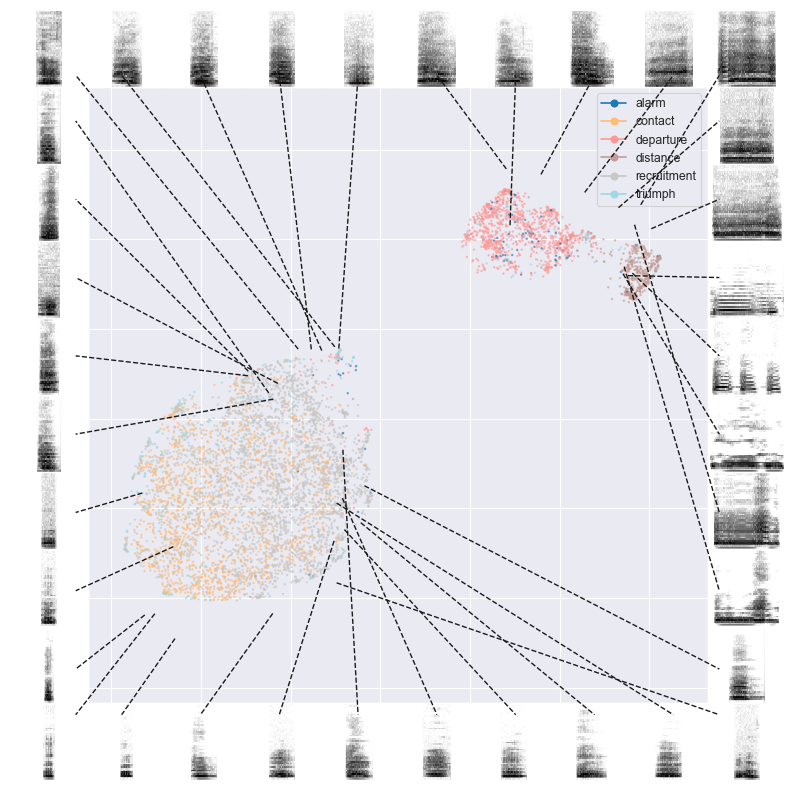

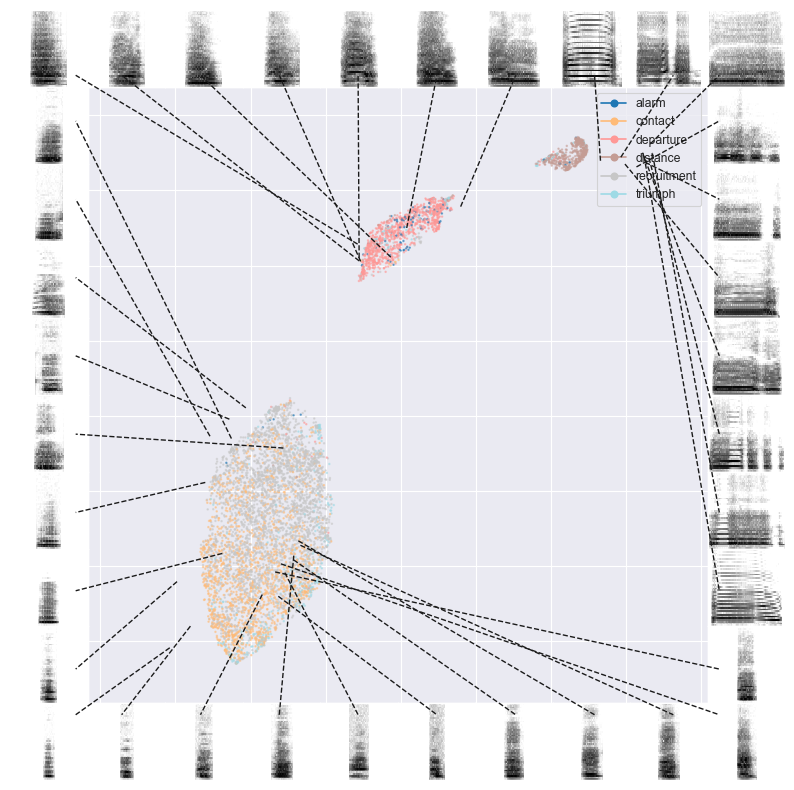

In [25]:
plotting.scatter_spec(embeddings_paf, subset_df["log_padded_spectrogram"], scatter_kwargs={"alpha": 0.5, "s": 1, "labels": subset_df["call_type"]})
plotting.scatter_spec(embeddings_lfcc, subset_df["log_padded_spectrogram"], scatter_kwargs={"alpha": 0.5, "s": 1, "labels": subset_df["call_type"]})
plotting.scatter_spec(embeddings_spec, subset_df["log_padded_spectrogram"], scatter_kwargs={"alpha": 0.5, "s": 1, "labels": subset_df["call_type"]})
plotting.scatter_spec(embeddings_vae, subset_df["log_padded_spectrogram"], scatter_kwargs={"alpha": 0.5, "s": 1, "labels": subset_df["call_type"]})

In [26]:
# export results_df
results_df.to_csv("pickles_and_csvs/results_resampled_50.csv", index=False)

# Inspect metrics

In [27]:
results_df = pd.read_csv("pickles_and_csvs/results_resampled_50.csv")
results_df.head()

,Representation,Algorithm,Distance metric,Subset size,N clusters,V-measure,Adj. RS,Hopkins,Silhouette Score,Modularity,Homogeneity,Completeness,Trustworthiness,Continuity
0,PAF,kMeans-preset,euclidean,50,6,0.507142,0.421229,0.918986,0.225753,NaN,0.503500,0.510838,0.951286,0.945338
1,PAF,kMeans,euclidean,50,10,0.524413,0.369335,0.918986,0.225753,NaN,0.595846,0.468274,0.951286,0.945338
2,PAF,HDBSCAN,euclidean,50,46,0.461419,0.109161,0.918986,0.225753,NaN,0.710060,0.341749,0.951286,0.945338
3,PAF,Leiden,euclidean,50,8,0.558817,0.466346,0.918986,0.442077,0.674246,0.588858,0.531693,0.951286,0.945338
4,lfcc,kMeans-preset,euclidean,50,6,0.433042,0.323114,0.987722,0.391076,NaN,0.432129,0.433959,0.986847,0.988978


In [28]:
results_df = results_df[
    ~((results_df["Algorithm"] == "Leiden-preset") & 
      (results_df["Subset size"] > 100) &
       (results_df["N clusters"] == 6))
]
results_df = results_df[
    ~((results_df["Algorithm"] == "Leiden-preset") & 
      (results_df["Subset size"] <= 100) &
       (results_df["N clusters"] == 5))
]

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3201930608.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3201930608.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3201930608.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3201930608.py:38: UserWarning: set_ticklabels() should only be used with a fixed

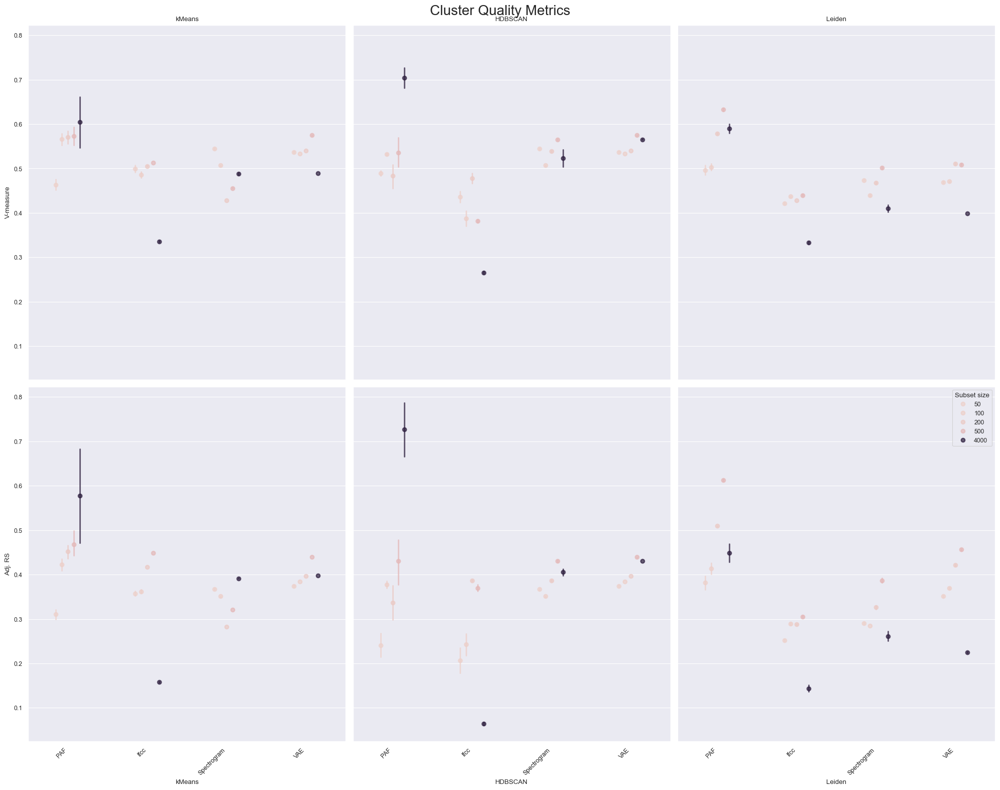

In [29]:
from statannotations.Annotator import Annotator
rows = ["V-measure", "Adj. RS"]
columns = ["kMeans", "HDBSCAN", "Leiden"]
pairs = [("PAF", "lfcc"), 
       ("PAF", "Spectrogram"), 
       ("PAF", "VAE"), 
       ("lfcc", "Spectrogram"), 
       ("lfcc", "VAE"), 
       ("Spectrogram", "VAE")]
representations = ["PAF", "lfcc", "Spectrogram", "VAE"]


fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(20, 16), sharex=True, sharey=True)
for row, metric in enumerate(rows):
    for col, representation in enumerate(columns):
        data = results_df[results_df["Algorithm"] == representation]

        sns.pointplot(
            x="Representation", 
            y=metric,  
            data=data, 
            ax=axs[row, col], 
            hue="Subset size", 
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
            legend=(True if row==1 and col==2 else False)
        )
        # annotator = Annotator(axs[row, col], data=data, x="Representation", y=metric, pairs=pairs)
        # annotator.configure(test='t-test_paired', text_format='star', loc='outside')
        # annotator.apply_and_annotate()

        if row == 0:
            axs[row, col].set_title(representation)

        #axs[row, col].set_ylim(0.1, 0.7)
        axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
        axs[row, col].set_xlabel(representation)

        if col == 0:
            axs[row, col].set_ylabel(metric)  # Label only the first column
        else:
            axs[row, col].set_ylabel('')

fig.suptitle("Cluster Quality Metrics", fontsize=20)
plt.tight_layout()
plt.show()

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1617818452.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1617818452.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1617818452.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1617818452.py:37: UserWarning: set_ticklabels() should only be used with a fixed

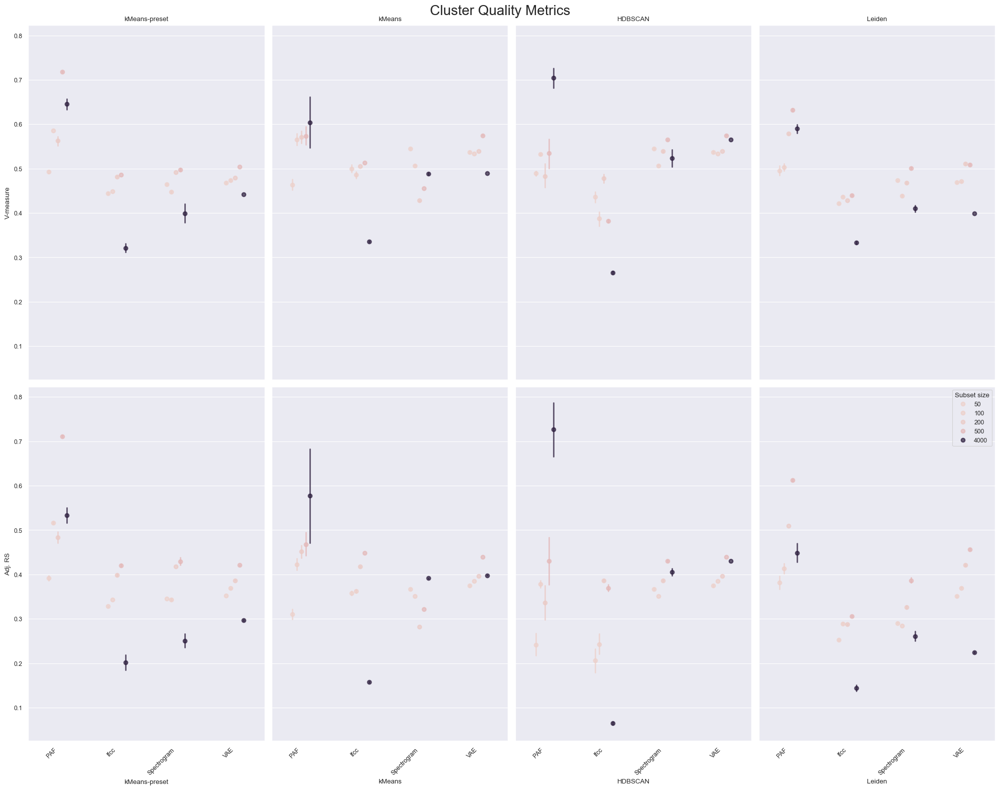

In [36]:
rows = ["V-measure", "Adj. RS"]
columns = ["kMeans-preset", "kMeans", "HDBSCAN", "Leiden"]
pairs = [("PAF", "lfcc"), 
       ("PAF", "Spectrogram"), 
       ("PAF", "VAE"), 
       ("lfcc", "Spectrogram"), 
       ("lfcc", "VAE"), 
       ("Spectrogram", "VAE")]
representations = ["PAF", "lfcc", "Spectrogram", "VAE"]


fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 16), sharex=True, sharey=True)
for row, metric in enumerate(rows):
    for col, representation in enumerate(columns):
        data = results_df[results_df["Algorithm"] == representation]

        sns.pointplot(
            x="Representation", 
            y=metric,  
            data=data, 
            ax=axs[row, col], 
            hue="Subset size", 
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
            legend=(True if row==1 and col==3 else False)
        )
        # annotator = Annotator(axs[row, col], data=data, x="Representation", y=metric, pairs=pairs)
        # annotator.configure(test='t-test_paired', text_format='star', loc='outside')
        # annotator.apply_and_annotate()

        if row == 0:
            axs[row, col].set_title(representation)

        #axs[row, col].set_ylim(0.1, 0.7)
        axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
        axs[row, col].set_xlabel(representation)

        if col == 0:
            axs[row, col].set_ylabel(metric)  # Label only the first column
        else:
            axs[row, col].set_ylabel('')

fig.suptitle("Cluster Quality Metrics", fontsize=20)
plt.tight_layout()
plt.show()

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3306695633.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3306695633.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3306695633.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3306695633.py:37: UserWarning: set_ticklabels() should only be used with a fixed

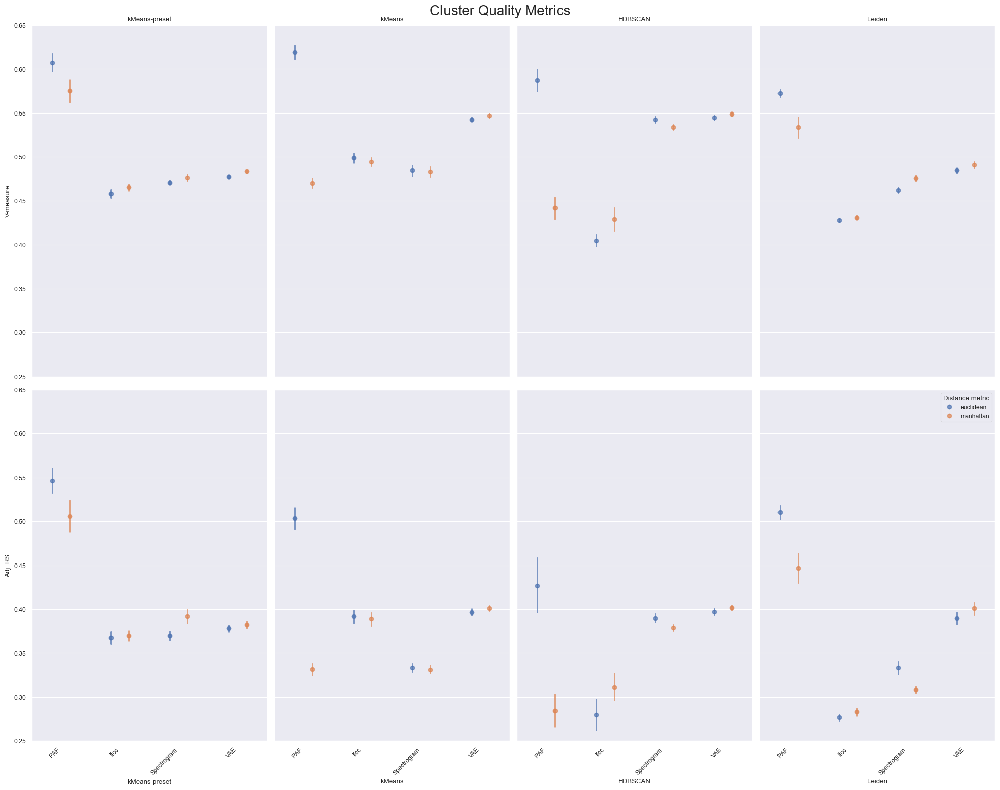

In [35]:
rows = ["V-measure", "Adj. RS"]
columns = ["kMeans-preset", "kMeans", "HDBSCAN", "Leiden"]
pairs = [("PAF", "lfcc"), 
       ("PAF", "Spectrogram"), 
       ("PAF", "VAE"), 
       ("lfcc", "Spectrogram"), 
       ("lfcc", "VAE"), 
       ("Spectrogram", "VAE")]
representations = ["PAF", "lfcc", "Spectrogram", "VAE"]


fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 16), sharex=True, sharey=True)
for row, metric in enumerate(rows):
    for col, representation in enumerate(columns):
        data = results_df[results_df["Algorithm"] == representation]

        sns.pointplot(
            x="Representation", 
            y=metric,  
            data=data, 
            ax=axs[row, col], 
            hue="Distance metric", 
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
            legend=(True if row==1 and col==3 else False)
        )
        # annotator = Annotator(axs[row, col], data=data, x="Representation", y=metric, pairs=pairs)
        # annotator.configure(test='t-test_paired', text_format='star', loc='outside')
        # annotator.apply_and_annotate()

        if row == 0:
            axs[row, col].set_title(representation)

        axs[row, col].set_ylim(0.25, 0.65)
        axs[row, col].set_xticklabels(representations, rotation=45, ha='right')
        axs[row, col].set_xlabel(representation)

        if col == 0:
            axs[row, col].set_ylabel(metric)  # Label only the first column
        else:
            axs[row, col].set_ylabel('')

fig.suptitle("Cluster Quality Metrics", fontsize=20)
plt.tight_layout()
plt.show()

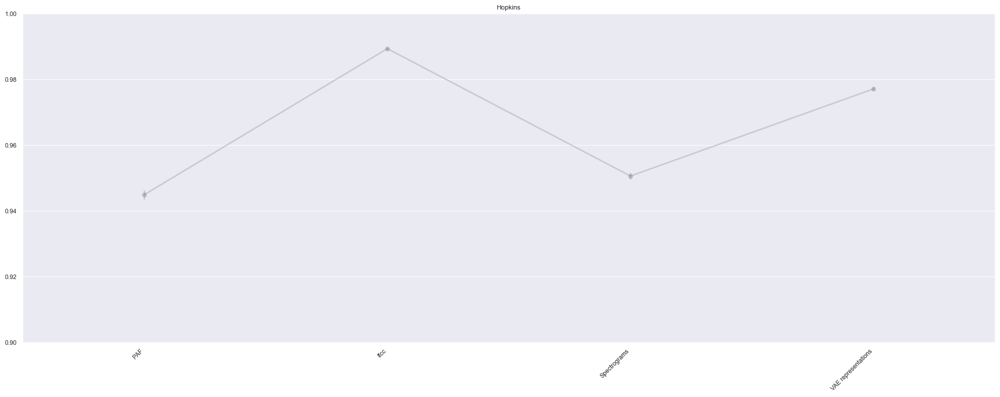

In [37]:
fig, axs = plt.subplots(ncols=1, figsize=(20, 8))

columns = ["Hopkins"]
for i, column in enumerate(columns):
    # # Raw data points
    # sns.stripplot(
    #     x="Representation", 
    #     y=column, 
    #     data=results_df, 
    #     ax=axs[i], 
    #     jitter=True, 
    #     size=10, 
    #     hue="Algorithm", 
    #     alpha=0.5, 
    #     legend=(True if i == len(columns)-1 else False)
    # )
    
    # Mean points
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs, 
        errorbar="ci",
        markers="o", 
        color="grey",
        alpha=.3
    )

    axs.set_xticks(range(len(['PAF', 'lfcc', 'Spectrograms', 'VAE representations'])))
    axs.set_xticklabels(['PAF', 'lfcc', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs.set_title(column)
    axs.set_xlabel('')
    axs.set_ylabel('')
    axs.set_ylim(0.9, 1)

plt.tight_layout()
plt.show()
# Homogeneity: measures to what proportion clusters contain only data points with the same label
# Completensess: measures if all members of the same class are also members of the same cluster

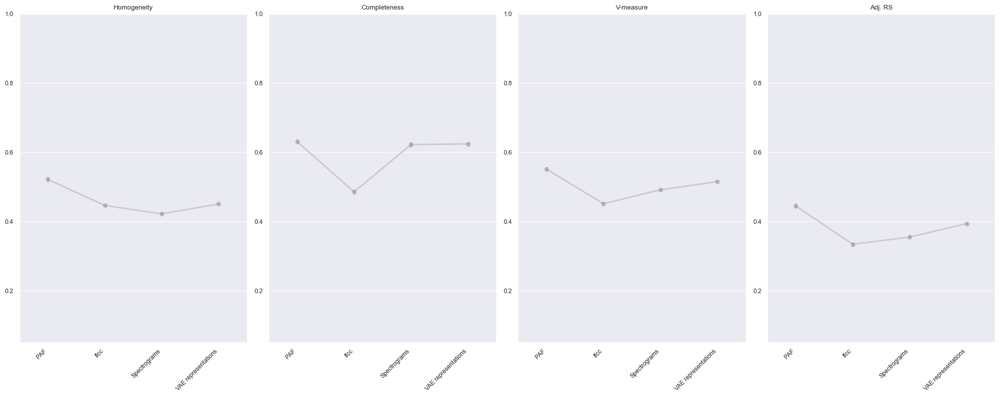

In [38]:
fig, axs = plt.subplots(ncols=4, figsize=(20, 8))

columns = ["Homogeneity", "Completeness", "V-measure", "Adj. RS"]
for i, column in enumerate(columns):
    # # Raw data points
    # sns.stripplot(
    #     x="Representation", 
    #     y=column, 
    #     data=results_df, 
    #     ax=axs[i], 
    #     jitter=True, 
    #     size=10, 
    #     hue="Algorithm", 
    #     alpha=0.5, 
    #     legend=(True if i == len(columns)-1 else False)
    # )
    
    # Mean points
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs[i], 
        errorbar="ci",
        markers="o", 
        color="grey",
        alpha=.3
    )

    axs[i].set_xticks(range(len(['PAF', 'lfcc', 'Spectrograms', 'VAE representations'])))
    axs[i].set_xticklabels(['PAF', 'lfcc', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs[i].set_title(column)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')
    axs[i].set_ylim(0.05, 1)

plt.tight_layout()
plt.show()
# Homogeneity: measures to what proportion clusters contain only data points with the same label
# Completensess: measures if all members of the same class are also members of the same cluster

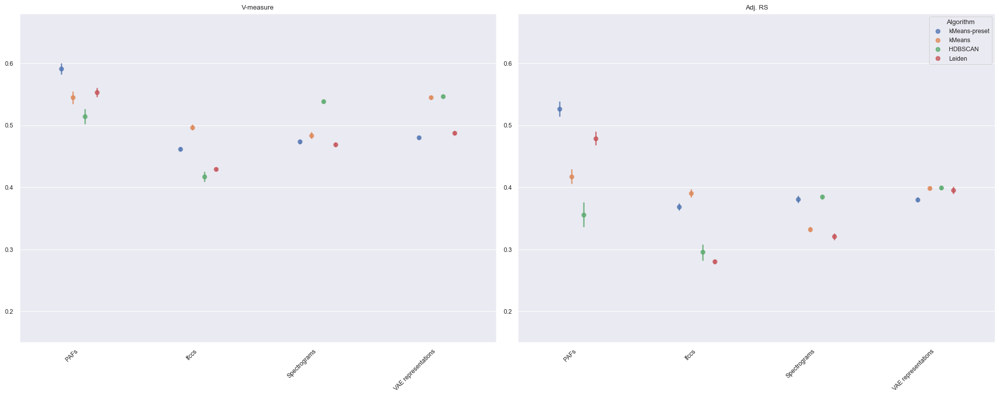

In [39]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 8))

columns = ["V-measure", "Adj. RS"]
for i, column in enumerate(columns):
    # Raw datapoints
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs[i], 
        hue="Algorithm", 
        legend=(True if i == len(columns)-1 else False),
        linestyle="none",
        alpha=.7,
        errorbar="ci",
        dodge=.3,
    )
    
    axs[i].set_xticks(range(len(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'])))
    axs[i].set_xticklabels(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs[i].set_title(column)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')
    axs[i].set_ylim(.15, .68)

plt.tight_layout()
plt.show()


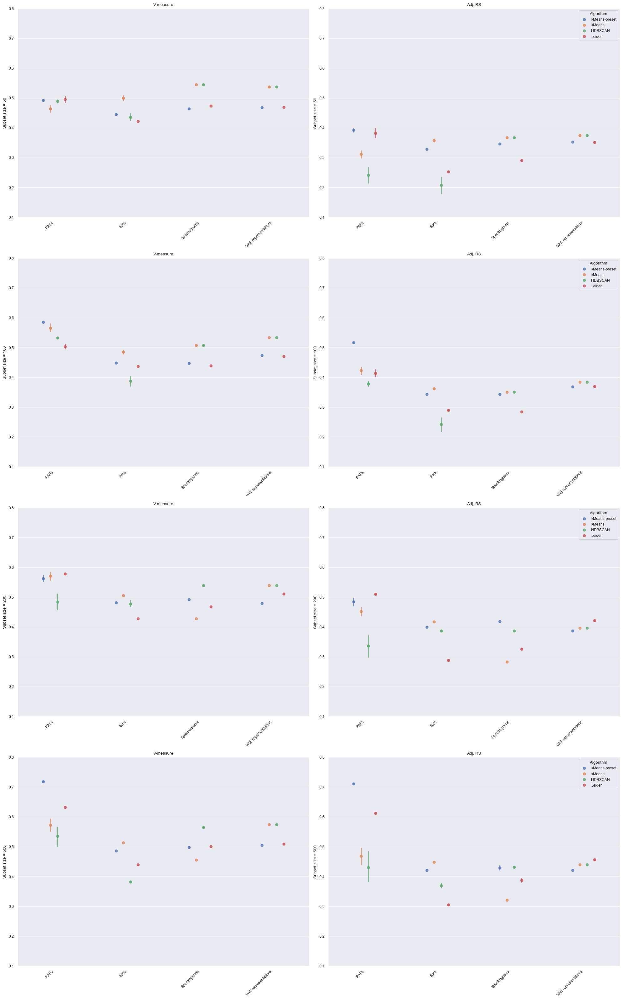

In [40]:
fig, axs = plt.subplots(ncols=2, nrows=4, figsize=(20, 8*4))

columns = ["V-measure", "Adj. RS"]
for j, sub_size in enumerate([50, 100, 200, 500]):
    for i, column in enumerate(columns):
        # Raw datapoints
        sns.pointplot(
            x="Representation", 
            y=column, 
            data=results_df[results_df["Subset size"]==sub_size], 
            ax=axs[j, i], 
            hue="Algorithm", 
            legend=(True if i == len(columns)-1 else False),
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
        )
    
        axs[j,i].set_xticks(range(len(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'])))
        axs[j,i].set_xticklabels(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
        axs[j,i].set_title(column)
        axs[j,i].set_xlabel('')
        axs[j,i].set_ylabel(f"Subset size = {sub_size}")
        axs[j,i].set_ylim(.1, .8)

plt.tight_layout()
plt.show()


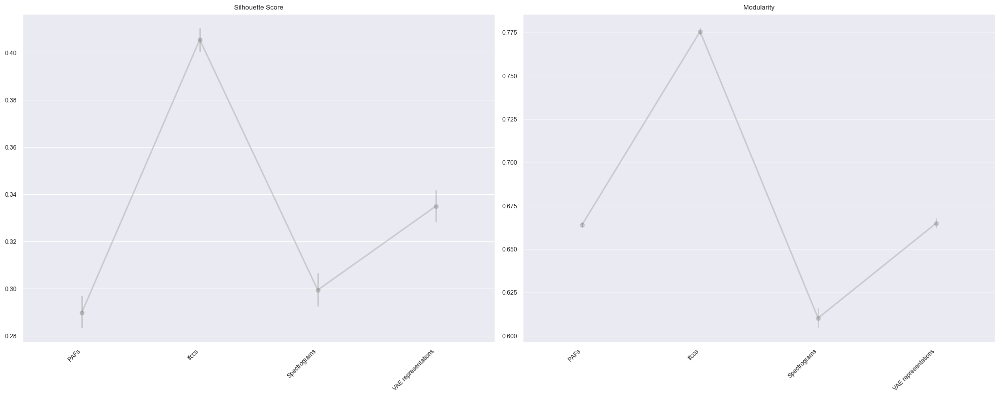

In [41]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 8))

columns = ["Silhouette Score", "Modularity"]
for i, column in enumerate(columns):
    # # Raw data points
    # sns.stripplot(
    #     x="Representation", 
    #     y=column, 
    #     data=results_df, 
    #     ax=axs[i], 
    #     jitter=True, 
    #     size=10, 
    #     hue="Algorithm", 
    #     legend=(True if i == len(columns)-1 else False)
    # )
    # Mean points
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs[i], 
        errorbar="ci",
        markers="o", 
        color="grey",
        alpha=0.3
    )

    axs[i].set_xticks(range(len(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'])))
    axs[i].set_xticklabels(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs[i].set_title(column)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')

plt.tight_layout()
plt.show()

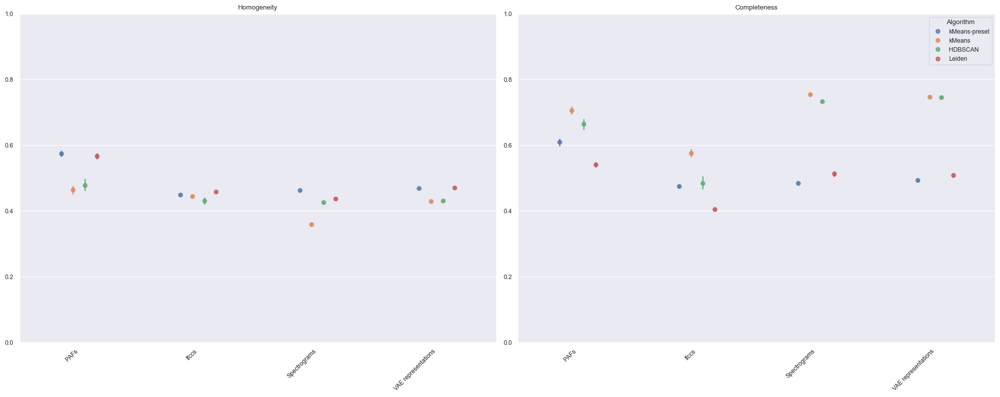

In [42]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 8))

columns = ["Homogeneity", "Completeness"]
for i, column in enumerate(columns):
    # Raw datapoints
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs[i], 
        hue="Algorithm", 
        legend=(True if i == len(columns)-1 else False),
        linestyle="none",
        alpha=.7,
        errorbar="ci",
        dodge=.3,
    )
    
    axs[i].set_xticks(range(len(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'])))
    axs[i].set_xticklabels(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs[i].set_title(column)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('')
    axs[i].set_ylim(0.0, 1)

plt.tight_layout()
plt.show()
# Homogeneity: measures to what proportion clusters contain only data points with the same label
# Completensess: measures if all members of the same class are also members of the same cluster

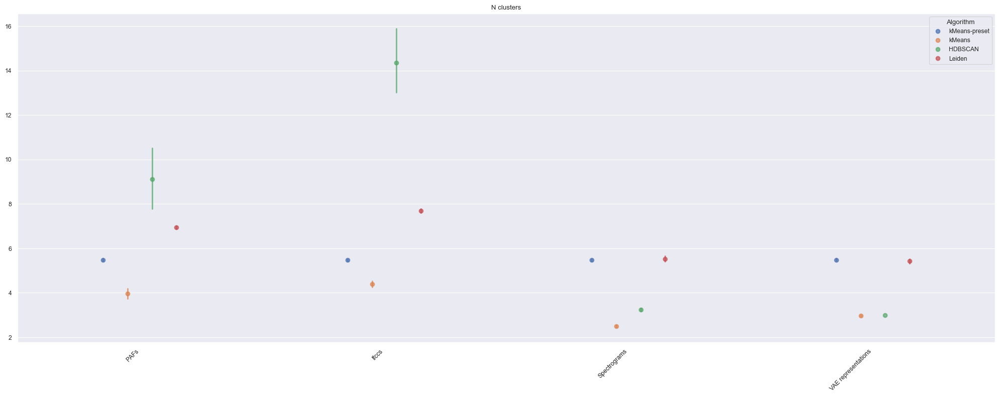

In [43]:
fig, axs = plt.subplots(ncols=1, figsize=(20, 8))

columns = ["N clusters"]
for i, column in enumerate(columns):
    # Raw datapoints
    sns.pointplot(
        x="Representation", 
        y=column, 
        data=results_df, 
        ax=axs, 
        hue="Algorithm", 
        legend=(True if i == len(columns)-1 else False),
        linestyle="none",
        alpha=.7,
        errorbar="ci",
        dodge=.3,
    )
    
    axs.set_xticks(range(len(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'])))
    axs.set_xticklabels(['PAFs', 'lfccs', 'Spectrograms', 'VAE representations'], rotation=45, ha='right')
    axs.set_title(column)
    axs.set_xlabel('')
    axs.set_ylabel('')
    #axs.set_ylim(0.0, 1)

plt.tight_layout()
plt.show()
# Homogeneity: measures to what proportion clusters contain only data points with the same label
# Completensess: measures if all members of the same class are also members of the same cluster

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1723561310.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1723561310.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/1723561310.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')


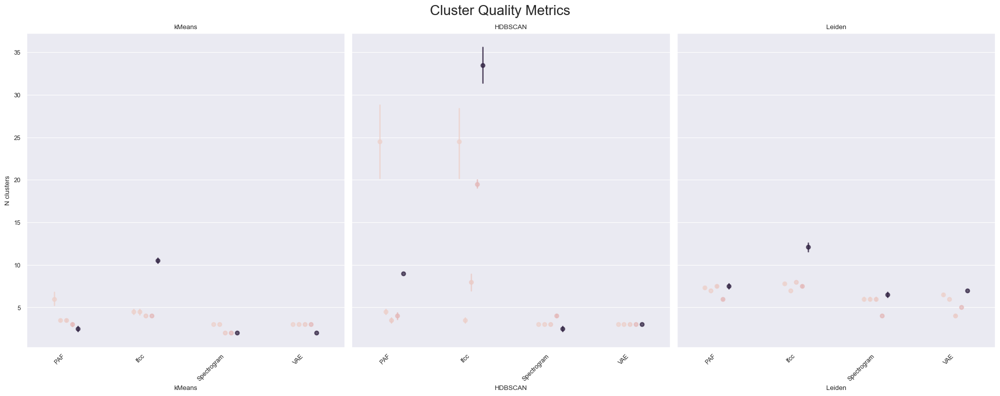

In [44]:
rows = ["N clusters"]
columns = ["kMeans", "HDBSCAN", "Leiden"]
pairs = [("PAF", "lfcc"), 
       ("PAF", "Spectrogram"), 
       ("PAF", "VAE"), 
       ("lfcc", "Spectrogram"), 
       ("lfcc", "VAE"), 
       ("Spectrogram", "VAE")]
representations = ["PAF", "lfcc", "Spectrogram", "VAE"]


fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 8), sharex=True, sharey=True)
for row, metric in enumerate(rows):
    for col, representation in enumerate(columns):
        data = results_df[results_df["Algorithm"] == representation]

        sns.pointplot(
            x="Representation", 
            y=metric,  
            data=data, 
            ax=axs[col], 
            hue="Subset size", 
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
            legend=(True if row==1 and col==3 else False)
        )
        # annotator = Annotator(axs[row, col], data=data, x="Representation", y=metric, pairs=pairs)
        # annotator.configure(test='t-test_paired', text_format='star', loc='outside')
        # annotator.apply_and_annotate()

        if row == 0:
            axs[col].set_title(representation)

        #axs[row, col].set_ylim(0.1, 0.7)
        axs[col].set_xticklabels(representations, rotation=45, ha='right')
        axs[col].set_xlabel(representation)

        if col == 0:
            axs[col].set_ylabel(metric)  # Label only the first column
        else:
            axs[col].set_ylabel('')

fig.suptitle("Cluster Quality Metrics", fontsize=20)
plt.tight_layout()
plt.show()

/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3925952819.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3925952819.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')
/var/folders/kl/qgqbw3bd42bf_tybhvnz9vxh0000gn/T/ipykernel_96750/3925952819.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[col].set_xticklabels(representations, rotation=45, ha='right')


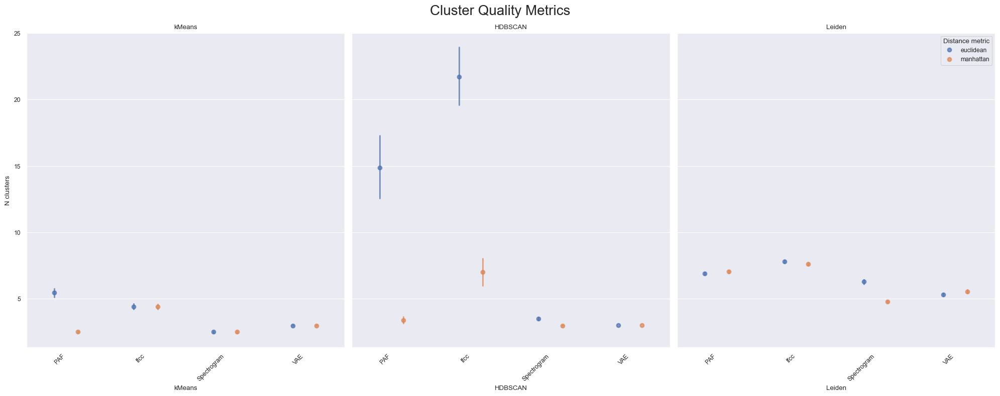

In [45]:
rows = ["N clusters"]
columns = ["kMeans", "HDBSCAN", "Leiden"]
pairs = [("PAF", "lfcc"), 
       ("PAF", "Spectrogram"), 
       ("PAF", "VAE"), 
       ("lfcc", "Spectrogram"), 
       ("lfcc", "VAE"), 
       ("Spectrogram", "VAE")]
representations = ["PAF", "lfcc", "Spectrogram", "VAE"]


fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(20, 8), sharex=True, sharey=True)
for row, metric in enumerate(rows):
    for col, representation in enumerate(columns):
        data = results_df[results_df["Algorithm"] == representation]

        sns.pointplot(
            x="Representation", 
            y=metric,  
            data=data, 
            ax=axs[col], 
            hue="Distance metric", 
            linestyle="none",
            alpha=.7,
            errorbar="ci",
            dodge=.3,
            legend=(True if row==0 and col==2 else False)
        )
        # annotator = Annotator(axs[row, col], data=data, x="Representation", y=metric, pairs=pairs)
        # annotator.configure(test='t-test_paired', text_format='star', loc='outside')
        # annotator.apply_and_annotate()

        if row == 0:
            axs[col].set_title(representation)

        #axs[row, col].set_ylim(0.1, 0.7)
        axs[col].set_xticklabels(representations, rotation=45, ha='right')
        axs[col].set_xlabel(representation)

        if col == 0:
            axs[col].set_ylabel(metric)  # Label only the first column
        else:
            axs[col].set_ylabel('')

fig.suptitle("Cluster Quality Metrics", fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
import statsmodels.formula.api as smf
import statsmodels.api as sm

results_without_preset = results_df.copy()[~(results_df["Algorithm"].isin(["kMeans-preset", "Leiden-preset"]))]

results_without_preset.rename(columns={'Subset size': 'Subset_size', 'V-measure': 'V_measure', 'Adj. RS': 'Adj_RS', 'Distance metric': 'distance_metric'}, inplace=True)

formula = "V_measure ~ C(Representation) + C(Algorithm) + Subset_size + distance_metric"
glm_beta = smf.glm(formula, data=results_without_preset,
                    family=sm.families.Binomial(link=sm.families.links.logit())).fit()
# glm_beta = sm.GLM(y, X, family=sm.families.Binomial(link=sm.families.links.logit())).fit()
print(glm_beta.summary())

formula = "Adj_RS ~ C(Representation) + C(Algorithm) + Subset_size + distance_metric"
glm_beta = smf.glm(formula, data=results_without_preset,
                    family=sm.families.Binomial(link=sm.families.links.logit())).fit()
# glm_beta = sm.GLM(y, X, family=sm.families.Binomial(link=sm.families.links.logit())).fit()
print(glm_beta.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              V_measure   No. Observations:                 4920
Model:                            GLM   Df Residuals:                     4912
Model Family:                Binomial   Df Model:                            7
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -2230.3
Date:                Mon, 03 Mar 2025   Deviance:                       72.244
Time:                        17:51:56   Pearson chi2:                     71.4
No. Iterations:                     3   Pseudo R-squ. (CS):           0.006153
Covariance Type:            nonrobust                                         
                                       coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercep

/Users/lenagies/anaconda3/envs/goose_vocalizations/lib/python3.11/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning: The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.
  warnings.warn(
/Users/lenagies/anaconda3/envs/goose_vocalizations/lib/python3.11/site-packages/statsmodels/genmod/families/links.py:13: FutureWarning: The logit link alias is deprecated. Use Logit instead. The logit link alias will be removed after the 0.15.0 release.
  warnings.warn(
